In [292]:
import json
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from matplotlib import pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import seaborn as sns
import plotly.graph_objs as go
%run DataBaseTraitement.ipynb
# from DataBaseTraitement import persisetDB as db

All existing tables: ()
l_recipe_ingredient user was found


In [293]:
def readJson(file):
    json_file = open(file, encoding='utf-8')
    data = json_file.read()
    recipes = json.loads(data)
    json_file.close()
    return recipes

In [294]:
def getListIngredient(recipesList):
    listIngre = []
    cpt_ingredient = {}
    frequence = 5
    for index, recipe in enumerate(recipesList):
        for i, ingredient in enumerate(recipe['ingredients']):
            if ingredient['nom_ingre'] not in listIngre:
                listIngre.append(ingredient['nom_ingre'])
                cpt_ingredient[ingredient['nom_ingre']] = 1
            else:
                  cpt_ingredient[ingredient['nom_ingre']] += 1
#     print("ingredient après suppression de doublons:",len(listIngre))
    d = sorted(cpt_ingredient.items(), key=lambda x: x[1], reverse=True)
#     print("ingredient et nombre d'appareance:",d)
    for k,v in cpt_ingredient.items():
# ["eau",'sel', "poivre","beure","farine","oeufs","huile d'olive","ail","oignon","lait","crème fraîche","oignons"]:
        if v < frequence:
            listIngre.remove(k)
#     print("ingredient et nombre d'appareance 2:",len(listIngre)) 
#     print("ingredient qui apparaissent plus de",frequence,":",len(listIngre))
    tmp = recipesList   
    for index, recipe in enumerate(recipesList):
        listIngreTmp = []
        for k, ingredient in enumerate(recipe['ingredients']):
            listIngreTmp.append(ingredient['nom_ingre'])
        if  any(x in listIngreTmp for x in listIngre) == False:
            del tmp[index]
    newTemp = []
    for key, value in enumerate(tmp):
        value['id_cluster'] = key
    print("Recettes après traitement:",len(tmp))
#     print("Recettes après traitement:",tmp)
    return  listIngre,tmp

In [295]:
def createVector(listIngredient, ListRecette):
    dataset = []
    listProvisoire = []
    vectorSize = len(listIngredient)
    recetteSize = len(ListRecette)
    for i, recette in enumerate(ListRecette):
        vector = np.zeros(vectorSize)
        for index, ingredient in enumerate(recette['ingredients']):
            listProvisoire.append(ingredient['nom_ingre'])
            for k,listIngre in enumerate(listIngredient):
                if listIngre in listProvisoire:
                    vector[k]= 1
            listProvisoire = []
        dataset.append(vector)
#         print(dataset)
    return np.array(dataset)

In [296]:
#Inertia measures how well a dataset was clustered by K-Means
# It is calculated by measuring the distance between each data point and its centroid, 
#squaring this distance, and summing these squares across one cluster.
def chooseOptimalCluster(dataset):
    sse = []
    k_list = range(1, 15)
    for k in k_list:
        km = KMeans(n_clusters=k)
        km.fit(dataset)
        sse.append([k, km.inertia_])
    oca_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
    plt.figure(figsize=(12,6))
    plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
    plt.title('Optimal Number of Clusters using Elbow Method (Scaled Data)')
    plt.xlabel('Number of clusters')
    plt.ylabel('Inertia')
    plt.show()

In [297]:
def kmeans(dataset, n_clusters):
    pca = PCA(70) # a changer
    #Transform the data
    dataset = pca.fit_transform(dataset)
    print("len dataset",len(dataset))
    kmeans = KMeans(n_clusters=n_clusters,init="random", random_state= 10)
    label = kmeans.fit_predict(dataset)
    centroids = kmeans.cluster_centers_
    u_labels = np.unique(label)
    plt.figure(figsize = (8,8))
    for i in u_labels:
        plt.scatter(dataset[label == i , 0] , dataset[label == i , 1] , label = i)
    plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color="black")
    plt.legend()
    plt.show()
    
    dataReturn = []
    for data in dataset:
        data = data[:3]
        dataReturn.append(data)
    return kmeans,dataReturn

In [298]:
# Using PCA to reduce the dataset into 3 principal 
def pca(dataset, n_clusters):
    kmeans_scale = KMeans(n_clusters=n_clusters, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(dataset)
    labels_scale = kmeans_scale.labels_
    pca2 = PCA(n_components=70).fit(dataset)
    pca2d = pca2.transform(dataset)
    plt.figure(figsize = (10,10))
    sns.scatterplot(pca2d[:,0], pca2d[:,1], 
                    hue=labels_scale, 
                    palette='Set1',
                    s=100, alpha=0.2).set_title('KMeans Clusters (4) Derived from Original Dataset', fontsize=15)
    plt.legend()
    plt.ylabel('PC2')
    plt.xlabel('PC1')
    plt.show()
    
    Scene = dict(xaxis = dict(title  = 'PC1'),yaxis = dict(title  = 'PC2'),zaxis = dict(title  = 'PC3'))
    labels = labels_scale
    trace = go.Scatter3d(x=pca2d[:,0], y=pca2d[:,1], z=pca2d[:,2], 
            mode='markers',marker=dict(color = labels, colorscale='Viridis', 
            size = 10, line = dict(color = 'gray',width = 5)))
    layout = go.Layout(margin=dict(l=0,r=0),scene = Scene, height = 1000,width = 1000)
    data = [trace]
    fig = go.Figure(data = data, layout = layout)
    fig.show()


In [299]:
#Feature Reduction via PCA
def featureReduce(df_scale):
    n_components = len(dataset[0])
    pca = PCA(n_components=n_components)
    pca_scale = pca.fit(df_scale)
    print(pca_scale)
    variance = pca.explained_variance_ratio_
    var = np.cumsum(np.round(variance, 3)*100)
    plt.figure(figsize=(12,6))
    plt.ylabel('% Variance Explained')
    plt.xlabel('# of Features')
    plt.title('PCA Analysis')
    plt.ylim(0,100.5)
    plt.plot(var)
    
    
    #check the variance ratio
    pca = PCA(n_components=6)
    pca_scale = pca.fit_transform(df_scale)
    pca_df_scale = pd.DataFrame(pca_scale, columns=['pc1','pc2','pc3','pc4','pc5','pc6'])
    print("pourcentage of the first PCAs")
    print("we will use 70 features instead of 338")
    print(pca.explained_variance_ratio_)
    return pca_scale

In [300]:
# Applying KMeans to PCA Principal Components
def elbowPCA(pca_df_scale):
    sse = []
    k_list = range(1, 15)
    for k in k_list:
        km = KMeans(n_clusters=k)
        km.fit(pca_df_scale)
        sse.append([k, km.inertia_])

    pca_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
    plt.figure(figsize=(12,6))
    plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
    plt.title('Optimal Number of Clusters using Elbow Method (PCA_Scaled Data)')
    plt.xlabel('Number of clusters')
    plt.ylabel('Inertia')

In [301]:
# Silhouette analysis can be used to study the separation distance between the resulting clusters
def silhouette(pca_df_scale):
    kmeans_pca_scale = KMeans(n_clusters=4, 
    n_init=100, max_iter=400, init='k-means++', random_state=46).fit(pca_df_scale)
    print('KMeans PCA Scaled Silhouette Score: {}'.format(silhouette_score(pca_df_scale, 
    kmeans_pca_scale.labels_, metric='euclidean')))
    labels_pca_scale = kmeans_pca_scale.labels_

le nombre de recettes raw 1632
Recettes après traitement: 1630
PCA(n_components=341)
pourcentage of the first PCAs
we will use 70 features instead of 338
[0.09767454 0.05678367 0.03192626 0.02887995 0.0256147  0.02227174]


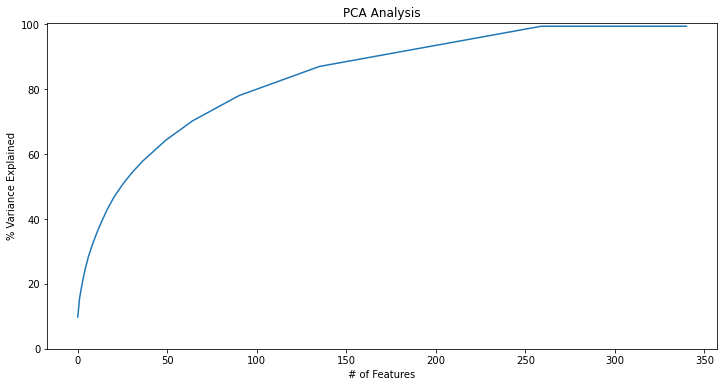

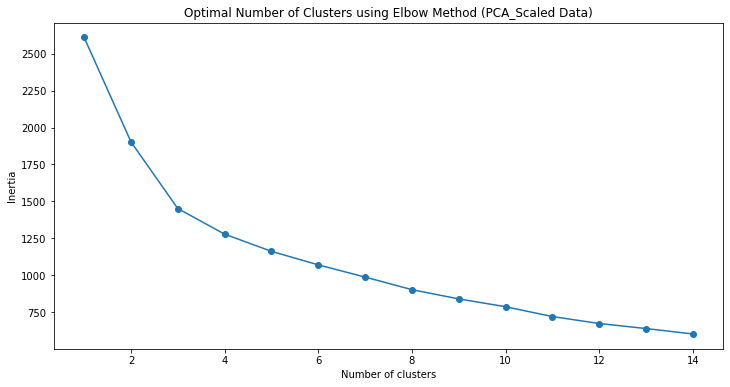

In [302]:
file = "test.json"
ListRecetteRaw = readJson(file)
print("le nombre de recettes raw",len(ListRecetteRaw))
listIngredient,listRecette = getListIngredient(ListRecetteRaw)
dataset = createVector(listIngredient, listRecette)
pca_scale = featureReduce(dataset)
elbowPCA(pca_scale)
# silhouette(pca_scale)

In [303]:
def get_ingredients(recipes):
        dict = {}
        for r in recipes:
            for i in r.get('ingredients', []):
                id = i.get('id_ingre')
                if id in dict:
                    dict[id][1] += 1
                else:
                    dict[id] = [i.get('nom_ingre'), 1]
        return dict
def get_ingr_rank(recipes):
    dict = get_ingredients(recipes)
    return sorted(dict.items(), key=lambda i: i[1][1], reverse=True)
#         return {k: v for k, v in sorted(listIngre.items(), key=lambda item: item[1], reverse=True)}

In [304]:
def linkCluster(kmeans,dataset,recipes,n_clusters):
    recipes_db = []
    for label in range(n_clusters):
        label_index = [i for i, x in enumerate(kmeans.labels_) if x == label]
#         recipes_cluster = [recipes[index] for index in label_index]
        recipes_cluster = []
        for index in label_index:
            for recipe in recipes:
                 if(recipe['id'] == index):
                        recipes_cluster.append(recipe)
        ingredients_ranked = get_ingr_rank(recipes_cluster)
        print("\n\nCluster", label, ":")
        ranking_string = ""
        for index in range(len(ingredients_ranked)):
            ingredient = ingredients_ranked[index]
            if ingredient[1][1] != np.nan and ingredient[1][0] != np.nan:
                ranking_string += ingredient[1][0] + " (" + str(ingredient[1][1]) + "), "
        print(ranking_string + '\n')
        for index_recipe in label_index:
            for recipe in recipes:
                if(recipe['id_cluster'] == index_recipe):
                    recipes_db.append([recipe,label,dataset[index_recipe]])
#                     print("Id recette:",recipe['id'],'\n')
#                     print("Nom Recette:",recipe['nom'])
#                     print("List Ingredients:")
#                     for ingrediet in recipe['ingredients']:
#                         print(ingrediet['nom_ingre'])
    persisetDB(recipes_db)
    print("recipes_db",len(recipes_db))

len dataset 1630


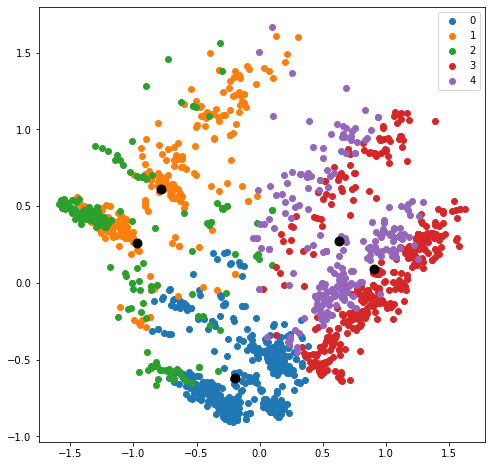

In [305]:
n_clusters = 5
k,d = kmeans(dataset,n_clusters)

In [306]:
linkCluster(k,d,listRecette,n_clusters)



Cluster 0 :
oignons (379), tomates cerise (378), ail (376), jus de citron (363), bouillon de volaille (331), feuille de laurier (288), sel (244), poivre (183), poulet (148), avocats (105), mangue (76), sauce teriyaki (47), échalote (35), sucre brun (22), chocolat blanc (13), oeufs (10), sucre en poudre (8), sucre en poudre (5), farine (4), sel (3), oeufs (3), thon (2), fenouil (1), tomate (1), tomate (1), tomates (1), herbes de Provence (1), origan (1), tabasco (1), ail (1), bûche de chèvre (1), lardons (1), lardons (1), champignon (1), olives (1), herbes de Provence (1), lardons (1), lardons (1), amandes (1), Noix concassé (1), roquefort (1), farine (1), farine (1), levure (1), huile (1), lait (1), emmental (1), sel (1), poivre (1), oeufs (1), 



Cluster 1 :
vin blanc (203), mont d'or (203), farine (201), lait (193), gruyère râpé (180), poivre (159), sel (137), jambon (111), crème (76), viande (56), boeuf (41), boeuf (29), os à moelle (23), citron (18), oeufs (16), oeufs (13), citr

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("lait\ de\ coco","124","https://assets\.afcdn\.com/recipe/20170607/67711_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("riz\ basmati\ Vivien\ Paille","125","https://assets\.afcdn\.com/recipe/20100101/ingredient_default_w96h96c1\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("chocolat\ au\ lait","126","https://assets\.afcdn\.com/recipe/20170622/69206_w96h96c1cxb700cyb700\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("pommes\ de\ terre\ rouges","127","https://assets\.afcdn\.com/recipe/20180719/81514_w96h96c1cx1700cy1395cxb3400cyb2791\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("avoine","128","https://assets\.afcdn\.com/recipe/20170607/67361_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredi

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("canneloni","388","https://assets\.afcdn\.com/recipe/20170623/69226_w96h96c1cxb3840cyb3840\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("épinards","389","https://assets\.afcdn\.com/recipe/20170607/67594_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("tahiné","390","https://assets\.afcdn\.com/recipe/20170621/69176_w96h96c1cxb700cyb700\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("chou\ rouge","391","https://assets\.afcdn\.com/recipe/20170922/72248_w96h96c1cx1834cy1834cxb3668cyb3668\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("mayonnaise","392","https://assets\.afcdn\.com/recipe/20170607/67759_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) v

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("épaule\ d'agneau","483","https://assets\.afcdn\.com/recipe/20170626/69252_w96h96c1cxb4752cyb3168\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("blanc\ de\ poireau","484","https://assets\.afcdn\.com/recipe/20171110/74693_w96h96c1cx1965cy1460cxb3930cyb2921\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("piments","485","https://assets\.afcdn\.com/recipe/20170607/67581_w96h96c1cx261cy261\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("steaks","486","https://assets\.afcdn\.com/recipe/20170621/69170_w96h96c1cxb700cyb700\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("safran","487","https://assets\.afcdn\.com/recipe/20170607/67372_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,u

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("gros\ sel","614","https://assets\.afcdn\.com/recipe/20170607/67497_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("marrons","615","https://assets\.afcdn\.com/recipe/20170607/67760_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("chocolat\ blanc","616","https://assets\.afcdn\.com/recipe/20170607/67543_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("châtaignes","617","https://assets\.afcdn\.com/recipe/20170607/67478_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("marasquin","618","https://assets\.afcdn\.com/recipe/20100101/ingredient_default_w96h96c1\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("clou\ 

INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("Chocolat\ NESTLÉ\ DESSERT\ Noir\ Corsé","824","https://assets\.afcdn\.com/recipe/20181227/85131_w96h96c1cx1200cy1200cxb2400cyb2400\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("thé","825","https://assets\.afcdn\.com/recipe/20170607/67435_w96h96c1cx350cy350\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("beurre\ salé","826","https://assets\.afcdn\.com/recipe/20201201/116001_w96h96c1cx912cy821cxb1824cyb1643\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("corn\ flakes","827","https://assets\.afcdn\.com/recipe/20170621/69007_w96h96c1cxb700cyb700\.jpg");
INGREDIENT :  insert into ingredient
            (name,id_ingredient,url_pic) values("crème\ dessert\ au\ chocolat","828","https://assets\.afcdn\.com/recipe/20180823/81882_w96h96c1cx2000cy2000cxb4000cyb4000\.jpg");
ING

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("97","Panna cotta mangue","['Dessert', 'Crème']","https://assets.afcdn.com/recipe/20160609/23930_w96h73c1cx1500cy1000.jpg","0","NO VALUES","15 min","5 min","-","très facile","bon marché","1","[ 0.15891208 -0.83217118  0.21028232]");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("98","Panna cotta chocolat blanc et gelée chocolat noir","['Dessert', 'Crème']","https://assets.afcdn.com/recipe/20130302/52436_w96h73c1cx256cy192.jpg","0","NO VALUES","20 min","15 min","-","facile","bon marché","1","[-0.01631361 -0.65406308 -0.26431273]");
RECIPE :: insert into recipe (id_recipe,name,ca

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("176","Gâteau au chocolat fondant","['Dessert', 'Gâteau']","https://assets.afcdn.com/recipe/20181228/85210_w96h73c1cx2272cy1627cxb3694cyb2444.jpg","0","NO VALUES","25 min","30 min","-","très facile","bon marché","1","[-0.16421861  0.13401276 -0.64446444]");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("177","Macarons à l'orange","['Dessert', 'Gâteau', 'Petits gâteaux']","https://assets.afcdn.com/recipe/20160627/53059_w96h73c1cx2736cy1824.jpg","0","NO VALUES","1 h","15 min","-","facile","bon marché","1","[-0.20990843 -0.87473803 -0.01091932]");
RECIPE :: insert into recipe (id_

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("310","Gin fizz facile","['Apéritif ou buffet', 'Cocktail apéritif']","https://assets.afcdn.com/recipe/20161113/2064_w96h73c1cx2064cy1161.jpg","0","NO VALUES","5 min","-","-","très facile","bon marché","1","[-0.32924889 -0.78329698 -0.03461326]");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("311","Sangria  allégée","['Apéritif ou buffet', 'Cocktail apéritif']","https://assets.afcdn.com/recipe/20170213/63550_w96h73c1cx2808cy1872.jpg","0","NO VALUES","1 min","-","-","très facile","bon marché","1","[-0.32570298 -0.73989469  0.11318627]");
RECIPE :: insert into recipe (id_recipe,

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("349","Cuisses de poulet à la semoule","['Plat principal', 'Viande', 'Viande en sauce']","https://assets.afcdn.com/recipe/20110504/19413_w96h73c1cx256cy192.jpg","0","NO VALUES","5 min","40 min","-","facile","bon marché","1","[-0.39901128 -0.66103964 -0.04405595]");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("350","Croûte savoyarde ou croûte au fromage","['Plat principal']","https://assets.afcdn.com/recipe/20171214/76028_w96h96c1cx2000cy3000cxb4000cyb6000.jpg","0","NO VALUES","10 min","20 min","-","facile","bon marché","1","[-0.50079406 -0.70015405  0.0311063 ]");
RECIPE :: i

(1406, "Data too long for column 'name' at row 1")
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("510","Brochette de poulet sauce satay","['Plat principal', 'Plat unique']","https://assets.afcdn.com/recipe/20140814/546_w96h73c1cx900cy1350.jpg","0","NO VALUES","20 min","30 min","-","très facile","bon marché","1","[-0.70285253 -0.14383684  0.03142185]");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("511","Marinade de poulet au citron vert","['Plat principal', 'Viande', 'Viande en sauce']","https://assets.afcdn.com/recipe/20150424/32124_w96h73c1cx383cy289.jpg","0","NO VALUES","5 min","10 min","-","facile","bon marché","1","[

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("623","côte de porc à la moutarde revisitée","['Plat principal', 'Viande', 'Viande rôtie']","https://assets.afcdn.com/recipe/20100101/recipe_default_img_placeholder_w96h96c1.jpg","1","NO VALUES","30 min","35 min","-","facile","bon marché","1","[-0.79742694  0.89873408 -0.04956576]");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("624","Faisan au raisin blanc et aux noix","['Plat principal', 'Viande', 'Viande rôtie']","https://assets.afcdn.com/recipe/20100101/recipe_default_img_placeholder_w96h96c1.jpg","1","NO VALUES","30 min","45 min","-","facile","moyen","1","[-0.32175997  0.

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("694","Lapin à la moutarde en cocotte en fonte","['Plat principal', 'Viande', 'Viande rôtie']","https://assets.afcdn.com/recipe/20150310/59032_w96h73c1cx320cy213.jpg","1","NO VALUES","20 min","2 h","-","facile","moyen","1","[-0.77344853  0.83761387  0.03552732]");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("695","Filet mignon en croûte rapide","['Plat principal', 'Viande', 'Viande rôtie']","https://assets.afcdn.com/recipe/20200622/112094_w96h96c1cx1920cy2880cxb3840cyb5760.jpg","1","NO VALUES","10 min","30 min","-","très facile","bon marché","1","[-1.01161454  0.30548969  0.1

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("853","Gratin de pâtes au chou-fleur et au parmesan","['Accompagnement']","https://assets.afcdn.com/recipe/20130731/40573_w96h73c1cx972cy1504.jpg","2","NO VALUES","30 min","15 min","-","facile","bon marché","1","[-1.28483317  0.43012171  0.06474138]");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("854","Crumble de tomates","['Accompagnement']","https://assets.afcdn.com/recipe/20130731/3495_w96h96c1cx996cy1504.jpg","2","NO VALUES","15 min","50 min","-","très facile","bon marché","1","[-0.71971541 -0.56458552  0.05720372]");
RECIPE :: insert into recipe (id_recipe,name,categorie

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1020","Tarte aux framboises meringuée","['Dessert', 'Tarte']","https://assets.afcdn.com/recipe/20100120/62708_w96h73c1cx256cy192.jpg","3","NO VALUES","20 min","30 min","-","facile","bon marché","1","[ 0.80670787 -0.27068067  0.0484538 ]");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1021","macaron ganache chocolat noir fraise et vin rouge","['Dessert', 'Sauce sucrée']","https://assets.afcdn.com/recipe/20140413/6855_w96h73c1cx972cy1296.jpg","3","NO VALUES","1 h","1 j 6 h","-","moyenne","bon marché","1","[ 0.6526905  -0.63986372 -0.32688561]");
RECIPE :: insert into recipe (i

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1151","Cookies au chocolat blanc, amandes et noix de coco","['Dessert']","https://assets.afcdn.com/recipe/20190728/95715_w96h73c1cx558cy419cxb1116cyb838.jpg","3","NO VALUES","1 h 25 min","12 min","-","facile","moyen","1","[ 0.56681305 -0.38763644  0.53164238]");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1152","Gâteau roulé chocolat-framboise","['Dessert', 'Gâteau']","https://assets.afcdn.com/recipe/20151215/42367_w96h73c1cx480cy360.jpg","3","NO VALUES","1 h","15 min","-","moyenne","bon marché","1","[1.17159371 0.7910741  0.27546436]");
RECIPE :: insert into recipe (id_rec

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1309","Mini marbré au chocolat noir ","['Dessert', 'Gâteau']","https://assets.afcdn.com/recipe/20191024/101105_w96h73c1cx2104cy1184cxb4208cyb2368.jpg","3","NO VALUES","15 min","20 min","-","facile","bon marché","1","[ 0.75673124  0.62156875 -0.27265803]");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1310","Marbré au chocolat facon italien","['Dessert', 'Gâteau']","https://assets.afcdn.com/recipe/20170106/26551_w96h73c1cx2016cy1322.jpg","3","NO VALUES","30 min","15 min","-","très facile","bon marché","1","[ 1.12441506  0.22969738 -0.47097546]");
RECIPE :: insert into recipe 

RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1440","Brownie fondant praliné","['Dessert', 'Gâteau', 'Gâteau au chocolat']","https://assets.afcdn.com/recipe/20201116/115643_w96h73c1cx2758cy2025cxb5616cyb3743.jpg","4","NO VALUES","30 min","20 min","-","très facile","bon marché","1","[ 0.59296094 -0.08898301 -0.7742394 ]");
RECIPE :: insert into recipe (id_recipe,name,categories,url_pic,clusterNumber,directions,prep_time,cook_time,
                                break_time,difficulty,budget,serving,coordonnees)                                values ("1441","Muffins express au pesto","['Entrée']","https://assets.afcdn.com/recipe/20180327/78188_w96h73c1cx2880cy1920cxb5760cyb3840.jpg","4","NO VALUES","5 min","15 min","-","très facile","bon marché","1","[0.55607431 0.08908521 0.71049256]");
RECIPE :: insert 

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "riz";
GET ID RECIPE : select id_recipe from recipe where name= "Poke bowl à l'hawaïenne";
CLE PRIMAIRE RECIPE : 1
TITRE RECIPE ::::: Poke bowl à l'hawaïenne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  720
Title Ingredient =  riz
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1","720","250");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sésame";
GET ID RECIPE : select id_recipe from recipe where name= "Poke bowl à l'hawaïenne";
CLE PRIMAIRE RECIPE : 1
TITRE RECIPE ::::: Poke bowl à l'hawaïenne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  657
Title Ingredient =  sésame
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1","657","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coriandre";


CLE PRIMAIRE RECIPE : 10
TITRE RECIPE ::::: Croque monsieur (presque) italien (facile)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  749
Title Ingredient =  fromage\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("10","749","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jambon\ de\ Parme";
GET ID RECIPE : select id_recipe from recipe where name= "Croque monsieur (presque) italien (facile)";
CLE PRIMAIRE RECIPE : 10
TITRE RECIPE ::::: Croque monsieur (presque) italien (facile)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  371
Title Ingredient =  jambon\ de\ Parme
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("10","371","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ brisée";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza hawaïenne";
CLE PRIMAIRE

CLE PRIMAIRE RECIPE : 14
TITRE RECIPE ::::: Mon couscous marocain
++++++++++++++++++++++++
CLE PRIMAIRE ING =  837
Title Ingredient =  carottes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("14","837","8");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Mon couscous marocain";
CLE PRIMAIRE RECIPE : 14
TITRE RECIPE ::::: Mon couscous marocain
++++++++++++++++++++++++
CLE PRIMAIRE ING =  881
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("14","881","8");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgettes";
GET ID RECIPE : select id_recipe from recipe where name= "Mon couscous marocain";
CLE PRIMAIRE RECIPE : 14
TITRE RECIPE ::::: Mon couscous marocain
++++++++++++++++++++++++
CLE PRI

CLE PRIMAIRE ING =  479
Title Ingredient =  cornichons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("16","479","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon\ au\ vinaigre";
GET ID RECIPE : select id_recipe from recipe where name= "Raclette ";
CLE PRIMAIRE RECIPE : 16
TITRE RECIPE ::::: Raclette 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  16
Title Ingredient =  oignon\ au\ vinaigre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("16","16","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "maïs";
GET ID RECIPE : select id_recipe from recipe where name= "Raclette ";
CLE PRIMAIRE RECIPE : 16
TITRE RECIPE ::::: Raclette 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  445
Title Ingredient =  maïs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recip

CLE PRIMAIRE ING =  917
Title Ingredient =  emmental
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("20","917","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ à\ pizza";
GET ID RECIPE : select id_recipe from recipe where name= "pizza chèvre miel crème fraiche";
CLE PRIMAIRE RECIPE : 20
TITRE RECIPE ::::: pizza chèvre miel crème fraiche
++++++++++++++++++++++++
CLE PRIMAIRE ING =  355
Title Ingredient =  pâte\ à\ pizza
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("20","355","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ de\ chèvre";
GET ID RECIPE : select id_recipe from recipe where name= "pizza chèvre miel crème fraiche";
CLE PRIMAIRE RECIPE : 20
TITRE RECIPE ::::: pizza chèvre miel crème fraiche
++++++++++++++++++++++++
CLE PRIMAIRE ING =  750
Title I

CLE PRIMAIRE RECIPE : 25
TITRE RECIPE ::::: Raclette d'été
++++++++++++++++++++++++
CLE PRIMAIRE ING =  370
Title Ingredient =  melon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("25","370","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crevettes";
GET ID RECIPE : select id_recipe from recipe where name= "Raclette d'été";
CLE PRIMAIRE RECIPE : 25
TITRE RECIPE ::::: Raclette d'été
++++++++++++++++++++++++
CLE PRIMAIRE ING =  537
Title Ingredient =  crevettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("25","537","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coppa";
GET ID RECIPE : select id_recipe from recipe where name= "Raclette d'été";
CLE PRIMAIRE RECIPE : 25
TITRE RECIPE ::::: Raclette d'été
++++++++++++++++++++++++
CLE PRIMAIRE ING =  24
Title Ingredient =  c

CLE PRIMAIRE ING =  522
Title Ingredient =  coulis\ de\ tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("31","522","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mozzarella";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza au saumon fumé et aux câpres";
CLE PRIMAIRE RECIPE : 31
TITRE RECIPE ::::: Pizza au saumon fumé et aux câpres
++++++++++++++++++++++++
CLE PRIMAIRE ING =  908
Title Ingredient =  mozzarella
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("31","908","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "câpres\ au\ vinaigre";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza au saumon fumé et aux câpres";
CLE PRIMAIRE RECIPE : 31
TITRE RECIPE ::::: Pizza au saumon fumé et aux câpres
++++++++++++++++++++++++
CLE PRIMAIRE ING

CLE PRIMAIRE RECIPE : 37
TITRE RECIPE ::::: Lasagnes végétariennes Corses
++++++++++++++++++++++++
CLE PRIMAIRE ING =  566
Title Ingredient =  courgettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("37","566","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes végétariennes Corses";
CLE PRIMAIRE RECIPE : 37
TITRE RECIPE ::::: Lasagnes végétariennes Corses
++++++++++++++++++++++++
CLE PRIMAIRE ING =  912
Title Ingredient =  thym
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("37","912","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "brocciu";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes végétariennes Corses";
CLE PRIMAIRE RECIPE : 37
TITRE RECIPE ::::: Lasagnes végétariennes Co

CLE PRIMAIRE ING =  956
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("394","956","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cassonade";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte facile aux framboises acidulées";
CLE PRIMAIRE RECIPE : 40
TITRE RECIPE ::::: Tarte facile aux framboises acidulées
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 394
TITRE RECIPE ::::: Tarte facile aux framboises acidulées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  959
Title Ingredient =  cassonade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("394","959","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "framboises";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte facile aux framboises acidulées";
CLE PRIMAIRE RECIPE : 4

CLE PRIMAIRE RECIPE : 45
TITRE RECIPE ::::: Poisson au curry express
++++++++++++++++++++++++
CLE PRIMAIRE ING =  29
Title Ingredient =  colin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("45","29","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgette";
GET ID RECIPE : select id_recipe from recipe where name= "Papillotes de saumon aux légumes du soleil";
CLE PRIMAIRE RECIPE : 46
TITRE RECIPE ::::: Papillotes de saumon aux légumes du soleil
++++++++++++++++++++++++
CLE PRIMAIRE ING =  562
Title Ingredient =  courgette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("46","562","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "aubergine";
GET ID RECIPE : select id_recipe from recipe where name= "Papillotes de saumon aux légumes du soleil";
CLE PRIMAIRE RECIPE : 46
TITRE REC

CLE PRIMAIRE RECIPE : 49
TITRE RECIPE ::::: Pudding de pain aux pommes et à la cannelle
++++++++++++++++++++++++
CLE PRIMAIRE ING =  893
Title Ingredient =  pommes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("49","893","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cannelle";
GET ID RECIPE : select id_recipe from recipe where name= "Pudding de pain aux pommes et à la cannelle";
CLE PRIMAIRE RECIPE : 49
TITRE RECIPE ::::: Pudding de pain aux pommes et à la cannelle
++++++++++++++++++++++++
CLE PRIMAIRE ING =  956
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("49","956","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pain";
GET ID RECIPE : select id_recipe from recipe where name= "Pudding de pain aux pommes et à la cannelle";
CLE PRIMAIRE

CLE PRIMAIRE ING =  672
Title Ingredient =  lait\ de\ riz
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("54","672","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "yaourt\ de\ soja";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au chocolat (sans lait et sans gluten)";
CLE PRIMAIRE RECIPE : 54
TITRE RECIPE ::::: Gâteau au chocolat (sans lait et sans gluten)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  169
Title Ingredient =  yaourt\ de\ soja
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("54","169","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au chocolat (sans lait et sans gluten)";
CLE PRIMAIRE RECIPE : 54
TITRE RECIPE ::::: Gâteau au chocolat (sans lait et sans gluten)
+++++++++

CLE PRIMAIRE ING =  899
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","899","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau ultra moelleux sans gluten, sans lactose, au chocolat";
CLE PRIMAIRE ING =  950
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","950","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir\ corsé";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau ultra moelleux sans gluten, sans lactose, au chocolat";
CLE PRIMAIRE ING =  31
Title Ingredient =  chocolat\ noir\ corsé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","3

CLE PRIMAIRE ING =  935
Title Ingredient =  poudre\ d'amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("64","935","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine\ de\ riz";
GET ID RECIPE : select id_recipe from recipe where name= "Mug Cake au chocolat sans gluten ";
CLE PRIMAIRE RECIPE : 64
TITRE RECIPE ::::: Mug Cake au chocolat sans gluten 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  670
Title Ingredient =  farine\ de\ riz
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("64","670","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Mug Cake au chocolat sans gluten ";
CLE PRIMAIRE RECIPE : 64
TITRE RECIPE ::::: Mug Cake au chocolat sans gluten 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  948
Title I

CLE PRIMAIRE RECIPE : 70
TITRE RECIPE ::::: Gratin de pâtes à la chair à saucisses
++++++++++++++++++++++++
CLE PRIMAIRE ING =  749
Title Ingredient =  fromage\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("70","749","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "épices";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de pâtes à la chair à saucisses";
CLE PRIMAIRE RECIPE : 70
TITRE RECIPE ::::: Gratin de pâtes à la chair à saucisses
++++++++++++++++++++++++
CLE PRIMAIRE ING =  783
Title Ingredient =  épices
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("70","783","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "torsades";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de pâtes à la chair à saucisses";
CLE PRIMAIRE RECIPE :

Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("76","961","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ brisée";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au citron et mascarpone";
CLE PRIMAIRE RECIPE : 77
TITRE RECIPE ::::: Tarte au citron et mascarpone
++++++++++++++++++++++++
CLE PRIMAIRE ING =  857
Title Ingredient =  pâte\ brisée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("77","857","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citrons";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au citron et mascarpone";
CLE PRIMAIRE RECIPE : 77
TITRE RECIPE ::::: Tarte au citron et mascarpone
++++++++++++++++++++++++
CLE PRIMAIRE ING =  719
Title Ingredient =  citrons
LIAISON INGREDIENT :  insert into 

CLE PRIMAIRE ING =  376
Title Ingredient =  chair\ à\ saucisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","376","120");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Vache\ qui\ rit®";
GET ID RECIPE : select id_recipe from recipe where name= "Courge farcie à la chair à saucisse et vache qui rit";
CLE PRIMAIRE ING =  715
Title Ingredient =  Vache\ qui\ rit®
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","715","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Courge farcie à la chair à saucisse et vache qui rit";
CLE PRIMAIRE ING =  386
Title Ingredient =  oignon\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","386","1");
SQL GET ID

CLE PRIMAIRE ING =  864
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  925
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("396","925","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Mousse au chocolat facile";
CLE PRIMAIRE RECIPE : 87
TITRE RECIPE ::::: Mousse au chocolat facile
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 396
TITRE RECIPE ::::: Mousse au chocolat facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  941
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("396","941","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Mousse au chocolat facile";
CLE

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère";
GET ID RECIPE : select id_recipe from recipe where name= "Courge farcie de ma grand-mère aux lardons et champignons";
CLE PRIMAIRE ING =  330
Title Ingredient =  gruyère
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","330","400");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carotte";
GET ID RECIPE : select id_recipe from recipe where name= "Saucisses aux lentilles ";
CLE PRIMAIRE RECIPE : 92
TITRE RECIPE ::::: Saucisses aux lentilles 
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 337
TITRE RECIPE ::::: Saucisses aux lentilles 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  829
Title Ingredient =  carotte
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("337","829","1");
SQL GET ID INGRE ::::::::: select id_ingredient from i

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème";
GET ID RECIPE : select id_recipe from recipe where name= "Panna cotta à la mangue";
CLE PRIMAIRE RECIPE : 95
TITRE RECIPE ::::: Panna cotta à la mangue
++++++++++++++++++++++++
CLE PRIMAIRE ING =  858
Title Ingredient =  crème
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("95","858","60");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mangue";
GET ID RECIPE : select id_recipe from recipe where name= "Panna cotta à la mangue";
CLE PRIMAIRE RECIPE : 95
TITRE RECIPE ::::: Panna cotta à la mangue
++++++++++++++++++++++++
CLE PRIMAIRE ING =  718
Title Ingredient =  mangue
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("95","718","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait"

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Verrines a l'avocat et à la vache qui rit";
CLE PRIMAIRE RECIPE : 100
TITRE RECIPE ::::: Verrines a l'avocat et à la vache qui rit
++++++++++++++++++++++++
CLE PRIMAIRE ING =  743
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("100","743","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "paprika";
GET ID RECIPE : select id_recipe from recipe where name= "Verrines a l'avocat et à la vache qui rit";
CLE PRIMAIRE RECIPE : 100
TITRE RECIPE ::::: Verrines a l'avocat et à la vache qui rit
++++++++++++++++++++++++
CLE PRIMAIRE ING =  745
Title Ingredient =  paprika
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("100","745","empty");
SQL GET ID ING

CLE PRIMAIRE ING =  722
Title Ingredient =  thon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("102","722","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mayonnaise";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de riz au thon";
CLE PRIMAIRE RECIPE : 102
TITRE RECIPE ::::: Salade de riz au thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  392
Title Ingredient =  mayonnaise
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("102","392","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chorizo";
GET ID RECIPE : select id_recipe from recipe where name= "Riz à la méditerranéenne";
CLE PRIMAIRE RECIPE : 103
TITRE RECIPE ::::: Riz à la méditerranéenne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  509
Title Ingredient =  chorizo
LIAISON INGREDIENT :  insert into c

CLE PRIMAIRE ING =  883
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("108","883","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Gratins de riz";
CLE PRIMAIRE RECIPE : 108
TITRE RECIPE ::::: Gratins de riz
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("108","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ semi\-épaisse";
GET ID RECIPE : select id_recipe from recipe where name= "Gratins de riz";
CLE PRIMAIRE RECIPE : 108
TITRE RECIPE ::::: Gratins de riz
++++++++++++++++++++++++
CLE PRIMAIRE ING =  478
Title Ingredient =  crème\ semi\-épaisse
LIAISON INGREDIENT :  insert into contain_recipe_

CLE PRIMAIRE RECIPE : 113
TITRE RECIPE ::::: Flammekueche rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  355
Title Ingredient =  pâte\ à\ pizza
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("113","355","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons\ fumés";
GET ID RECIPE : select id_recipe from recipe where name= "Flammekueche rapide";
CLE PRIMAIRE RECIPE : 113
TITRE RECIPE ::::: Flammekueche rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  518
Title Ingredient =  lardons\ fumés
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("113","518","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Flammekueche rapide";
CLE PRIMAIRE RECIPE : 113
TITRE RECIPE ::::: Flammekueche rapide
+++++++++++++

CLE PRIMAIRE ING =  562
Title Ingredient =  courgette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("120","562","⁄");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ à\ pizza";
GET ID RECIPE : select id_recipe from recipe where name= "Flammekueche végétarienne";
CLE PRIMAIRE RECIPE : 120
TITRE RECIPE ::::: Flammekueche végétarienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  355
Title Ingredient =  pâte\ à\ pizza
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("120","355","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche\ épaisse";
GET ID RECIPE : select id_recipe from recipe where name= "Flammekueche végétarienne";
CLE PRIMAIRE RECIPE : 120
TITRE RECIPE ::::: Flammekueche végétarienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  847
Title Ingredient =  crème\

CLE PRIMAIRE ING =  787
Title Ingredient =  bananes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("295","787","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait\ de\ coco";
GET ID RECIPE : select id_recipe from recipe where name= "Piña Colada originale";
CLE PRIMAIRE RECIPE : 129
TITRE RECIPE ::::: Piña Colada originale
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 296
TITRE RECIPE ::::: Piña Colada originale
++++++++++++++++++++++++
CLE PRIMAIRE ING =  124
Title Ingredient =  lait\ de\ coco
CLE PRIMAIRE ING =  885
Title Ingredient =  lait\ de\ coco
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("296","885","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "rhum\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Piña Colada originale";
CLE PRIMAIRE RECIPE :

CLE PRIMAIRE ING =  635
Title Ingredient =  glaçons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","635","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citrons";
GET ID RECIPE : select id_recipe from recipe where name= "Limoncello (liqueur de citron)";
CLE PRIMAIRE RECIPE : 136
TITRE RECIPE ::::: Limoncello (liqueur de citron)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  719
Title Ingredient =  citrons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("136","719","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Limoncello (liqueur de citron)";
CLE PRIMAIRE RECIPE : 136
TITRE RECIPE ::::: Limoncello (liqueur de citron)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGR

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ brisée";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au miel, citron et gingembre";
CLE PRIMAIRE RECIPE : 143
TITRE RECIPE ::::: Tarte au miel, citron et gingembre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  857
Title Ingredient =  pâte\ brisée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("143","857","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au miel, citron et gingembre";
CLE PRIMAIRE RECIPE : 143
TITRE RECIPE ::::: Tarte au miel, citron et gingembre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  396
Title Ingredient =  miel
CLE PRIMAIRE ING =  922
Title Ingredient =  miel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("143","922"

CLE PRIMAIRE RECIPE : 151
TITRE RECIPE ::::: Navettes au crabe au citron & gingembre confits
++++++++++++++++++++++++
CLE PRIMAIRE ING =  938
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("151","938","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "endives";
GET ID RECIPE : select id_recipe from recipe where name= "Navettes au crabe au citron & gingembre confits";
CLE PRIMAIRE RECIPE : 151
TITRE RECIPE ::::: Navettes au crabe au citron & gingembre confits
++++++++++++++++++++++++
CLE PRIMAIRE ING =  651
Title Ingredient =  endives
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("151","651","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crabe";
GET ID RECIPE : select id_recipe from recipe where name= "Navettes au crabe au citron & gingembre confits

CLE PRIMAIRE ING =  949
Title Ingredient =  beurre\ tendre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("377","949","75");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ glace";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux fraises sans cuisson";
CLE PRIMAIRE RECIPE : 160
TITRE RECIPE ::::: Tarte aux fraises sans cuisson
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 378
TITRE RECIPE ::::: Tarte aux fraises sans cuisson
++++++++++++++++++++++++
CLE PRIMAIRE ING =  921
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("378","921","60");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux fraises sans cuisson";
CLE PRIMAIRE RECIPE : 160
TITRE RECI

CLE PRIMAIRE ING =  676
Title Ingredient =  rhubarbe
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","676","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ blond";
GET ID RECIPE : select id_recipe from recipe where name= "Parfait glacé à la rhubarbe, coulis de framboises (5ème Rencontre Marmiton)";
CLE PRIMAIRE ING =  53
Title Ingredient =  sucre\ blond
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","53","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaunes\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Parfait glacé à la rhubarbe, coulis de framboises (5ème Rencontre Marmiton)";
CLE PRIMAIRE ING =  929
Title Ingredient =  jaunes\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  value

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Tiramisu aux fraises et génoise";
CLE PRIMAIRE RECIPE : 167
TITRE RECIPE ::::: Tiramisu aux fraises et génoise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  950
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("167","950","150");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Tiramisu aux fraises et génoise";
CLE PRIMAIRE RECIPE : 167
TITRE RECIPE ::::: Tiramisu aux fraises et génoise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  938
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("167","938","1");
SQL GET ID INGRE ::::::::: select id_i

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "amandes";
GET ID RECIPE : select id_recipe from recipe where name= "petits macarons à l'amande";
CLE PRIMAIRE RECIPE : 174
TITRE RECIPE ::::: petits macarons à l'amande
++++++++++++++++++++++++
CLE PRIMAIRE ING =  946
Title Ingredient =  amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("174","946","250");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blancs\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "petits macarons à l'amande";
CLE PRIMAIRE RECIPE : 174
TITRE RECIPE ::::: petits macarons à l'amande
++++++++++++++++++++++++
CLE PRIMAIRE ING =  924
Title Ingredient =  blancs\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("174","924","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredien

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mascarpone";
GET ID RECIPE : select id_recipe from recipe where name= "Macarons à l'orange";
CLE PRIMAIRE RECIPE : 177
TITRE RECIPE ::::: Macarons à l'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  796
Title Ingredient =  mascarpone
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("177","796","80");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake facile";
CLE PRIMAIRE RECIPE : 178
TITRE RECIPE ::::: Cheesecake facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  854
Title Ingredient =  fromage\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("178","854","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where na

CLE PRIMAIRE RECIPE : 181
TITRE RECIPE ::::: Macarons coco
++++++++++++++++++++++++
CLE PRIMAIRE ING =  955
Title Ingredient =  rhum
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("181","955","5");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "raisins\ secs";
GET ID RECIPE : select id_recipe from recipe where name= "Macarons coco";
CLE PRIMAIRE RECIPE : 181
TITRE RECIPE ::::: Macarons coco
++++++++++++++++++++++++
CLE PRIMAIRE ING =  815
Title Ingredient =  raisins\ secs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("181","815","25");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blancs\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Macarons coco";
CLE PRIMAIRE RECIPE : 181
TITRE RECIPE ::::: Macarons coco
++++++++++++++++++++++++
CLE PRIMAIRE ING =  924
Title

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Pudding au Cookeo";
CLE PRIMAIRE RECIPE : 187
TITRE RECIPE ::::: Pudding au Cookeo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("187","961","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "riz\ basmati";
GET ID RECIPE : select id_recipe from recipe where name= "riz à la noix de coco ";
CLE PRIMAIRE RECIPE : 188
TITRE RECIPE ::::: riz à la noix de coco 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  188
Title Ingredient =  riz\ basmati
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("188","188","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait

CLE PRIMAIRE ING =  153
Title Ingredient =  meringue
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("194","153","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "praline";
GET ID RECIPE : select id_recipe from recipe where name= "Mousse au chocolat, meringues et pralines";
CLE PRIMAIRE RECIPE : 194
TITRE RECIPE ::::: Mousse au chocolat, meringues et pralines
++++++++++++++++++++++++
CLE PRIMAIRE ING =  663
Title Ingredient =  praline
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("194","663","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ pâtissier";
GET ID RECIPE : select id_recipe from recipe where name= "Mini-tartes au chocolat et aux spéculoos";
CLE PRIMAIRE RECIPE : 195
TITRE RECIPE ::::: Mini-tartes au chocolat et aux spéculoos
++++++++++++++++++++++++
CLE PRI

CLE PRIMAIRE RECIPE : 204
TITRE RECIPE ::::: Cocotella, pâte à tartiner noix de coco chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  945
Title Ingredient =  noix\ de\ coco\ rapée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("204","945","50");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ de\ riz";
GET ID RECIPE : select id_recipe from recipe where name= "Cocotella, pâte à tartiner noix de coco chocolat";
CLE PRIMAIRE RECIPE : 204
TITRE RECIPE ::::: Cocotella, pâte à tartiner noix de coco chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  572
Title Ingredient =  crème\ de\ riz
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("204","572","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes";
GET ID RECIPE : select id_recipe from recipe where name= "Brick de po

CLE PRIMAIRE RECIPE : 212
TITRE RECIPE ::::: Camembert rôti au miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  396
Title Ingredient =  miel
CLE PRIMAIRE ING =  922
Title Ingredient =  miel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("212","922","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre\ balsamique";
GET ID RECIPE : select id_recipe from recipe where name= "Camembert rôti au miel";
CLE PRIMAIRE RECIPE : 212
TITRE RECIPE ::::: Camembert rôti au miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  542
Title Ingredient =  vinaigre\ balsamique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("212","542","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "camemberts";
GET ID RECIPE : select id_recipe from recipe where name= "Camembert rôti au miel";
CLE PRIMAIRE RE

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Côte de porc sur lit d'orange";
CLE PRIMAIRE RECIPE : 220
TITRE RECIPE ::::: Côte de porc sur lit d'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  881
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("220","881","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Côte de porc sur lit d'orange";
CLE PRIMAIRE RECIPE : 220
TITRE RECIPE ::::: Côte de porc sur lit d'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  899
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("220","899","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
     

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce au chocolat rapide";
CLE PRIMAIRE RECIPE : 228
TITRE RECIPE ::::: Sauce au chocolat rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  958
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("228","958","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ pâtissier";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce chocolat";
CLE PRIMAIRE RECIPE : 229
TITRE RECIPE ::::: Sauce chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  702
Title Ingredient =  chocolat\ pâtissier
CLE PRIMAIRE ING =  866
Title Ingredient =  chocolat\ pâtissier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("229","866","250");
SQL GET ID INGRE :::::

CLE PRIMAIRE ING =  951
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("236","951","⁄");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Madeleines vegan";
CLE PRIMAIRE RECIPE : 236
TITRE RECIPE ::::: Madeleines vegan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("236","909","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait\ d'avoine";
GET ID RECIPE : select id_recipe from recipe where name= "Madeleines vegan";
CLE PRIMAIRE RECIPE : 236
TITRE RECIPE ::::: Madeleines vegan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  73
Title Ingredient =  lait\ d'avoine
LIAISON INGREDIENT :  insert into contain_recipe_ing

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait\ de\ soja";
GET ID RECIPE : select id_recipe from recipe where name= "Madeleines au citron végétaliennes";
CLE PRIMAIRE RECIPE : 241
TITRE RECIPE ::::: Madeleines au citron végétaliennes
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 472
TITRE RECIPE ::::: Madeleines au citron végétaliennes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  868
Title Ingredient =  lait\ de\ soja
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("472","868","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Madeleines au citron végétaliennes";
CLE PRIMAIRE RECIPE : 241
TITRE RECIPE ::::: Madeleines au citron végétaliennes
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 472
TITRE RECIPE ::::: Madeleines au citron végétaliennes
+++++++++++++++++++++

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche\ épaisse";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce caramel au beurre (ou butterscotch)";
CLE PRIMAIRE RECIPE : 247
TITRE RECIPE ::::: Sauce caramel au beurre (ou butterscotch)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  847
Title Ingredient =  crème\ fraîche\ épaisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("247","847","75");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux pommes";
CLE PRIMAIRE RECIPE : 248
TITRE RECIPE ::::: Tarte aux pommes
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 318
TITRE RECIPE ::::: Tarte aux pommes
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 398
TITRE RECIPE ::::: Tarte aux pommes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  893
Title Ingre

CLE PRIMAIRE RECIPE : 250
TITRE RECIPE ::::: mousse de chocolat blanc au citron vert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  661
Title Ingredient =  crème\ chantilly
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("250","661","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ pâtissier";
GET ID RECIPE : select id_recipe from recipe where name= "Trianon aux spéculoos";
CLE PRIMAIRE RECIPE : 251
TITRE RECIPE ::::: Trianon aux spéculoos
++++++++++++++++++++++++
CLE PRIMAIRE ING =  702
Title Ingredient =  chocolat\ pâtissier
CLE PRIMAIRE ING =  866
Title Ingredient =  chocolat\ pâtissier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("251","866","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Triano

CLE PRIMAIRE ING =  893
Title Ingredient =  pommes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","893","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux pommes croustillante en crème de caramel beurre salé";
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","684","110");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait\ demi\-écrémé";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux pommes croustillante en crème de caramel beurre salé";
CLE PRIMAIRE ING =  658
Title Ingredient =  lait\ demi\-écrémé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","658","250");
SQL GET ID I

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux pommes à l'Alsacienne";
CLE PRIMAIRE RECIPE : 259
TITRE RECIPE ::::: Tarte aux pommes à l'Alsacienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  941
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("259","941","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux pommes à l'Alsacienne";
CLE PRIMAIRE RECIPE : 259
TITRE RECIPE ::::: Tarte aux pommes à l'Alsacienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("259","961","2");
SQL GET ID INGRE ::::::::: select id_ingredient 

CLE PRIMAIRE ING =  926
Title Ingredient =  vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("266","926","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poires";
GET ID RECIPE : select id_recipe from recipe where name= "Poires aux spéculoos";
CLE PRIMAIRE RECIPE : 266
TITRE RECIPE ::::: Poires aux spéculoos
++++++++++++++++++++++++
CLE PRIMAIRE ING =  903
Title Ingredient =  poires
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("266","903","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Lait\ Concentré\ Sucré\ sans\ Lactose\ NESTLÉ";
GET ID RECIPE : select id_recipe from recipe where name= "Rochers coco au Lait Concentré Sucré Sans Lactose";
CLE PRIMAIRE RECIPE : 267
TITRE RECIPE ::::: Rochers coco au Lait Concentré Sucré Sans Lactose
++++++++++++++++++++++++
CLE PRIM

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ frais";
GET ID RECIPE : select id_recipe from recipe where name= "Verrines crevettes mousse fromage frais aux herbes";
CLE PRIMAIRE RECIPE : 274
TITRE RECIPE ::::: Verrines crevettes mousse fromage frais aux herbes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  942
Title Ingredient =  fromage\ frais
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("274","942","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalote";
GET ID RECIPE : select id_recipe from recipe where name= "Verrines crevettes mousse fromage frais aux herbes";
CLE PRIMAIRE RECIPE : 274
TITRE RECIPE ::::: Verrines crevettes mousse fromage frais aux herbes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  560
Title Ingredient =  échalote
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,

CLE PRIMAIRE ING =  475
Title Ingredient =  oignons\ nouveaux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("280","475","12");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cerfeuil";
GET ID RECIPE : select id_recipe from recipe where name= "Petits pois à la française par Laurent Mariotte";
CLE PRIMAIRE RECIPE : 280
TITRE RECIPE ::::: Petits pois à la française par Laurent Mariotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  462
Title Ingredient =  cerfeuil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("280","462","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Petits pois à la française par Laurent Mariotte";
CLE PRIMAIRE RECIPE : 280
TITRE RECIPE ::::: Petits pois à la française par Laurent Mario

CLE PRIMAIRE ING =  677
Title Ingredient =  menthe
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("312","677","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pain\ de\ mie";
GET ID RECIPE : select id_recipe from recipe where name= "Croque-monsieur apéritif";
CLE PRIMAIRE RECIPE : 19
TITRE RECIPE ::::: Croque-monsieur apéritif
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 286
TITRE RECIPE ::::: Croque-monsieur apéritif
++++++++++++++++++++++++
CLE PRIMAIRE ING =  224
Title Ingredient =  pain\ de\ mie
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("286","224","8");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Croque-monsieur apéritif";
CLE PRIMAIRE RECIPE : 19
TITRE RECIPE ::::: Croque-monsieur apérit

CLE PRIMAIRE RECIPE : 128
TITRE RECIPE ::::: Rhum arrangé
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 295
TITRE RECIPE ::::: Rhum arrangé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  956
Title Ingredient =  cannelle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("295","956","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ de\ canne";
GET ID RECIPE : select id_recipe from recipe where name= "Rhum arrangé";
CLE PRIMAIRE RECIPE : 128
TITRE RECIPE ::::: Rhum arrangé
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 295
TITRE RECIPE ::::: Rhum arrangé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  894
Title Ingredient =  sucre\ de\ canne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("295","894","15");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bananes";
GET ID RECIPE : selec

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oranges";
GET ID RECIPE : select id_recipe from recipe where name= "Sangria sans alcool facile";
CLE PRIMAIRE RECIPE : 300
TITRE RECIPE ::::: Sangria sans alcool facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  952
Title Ingredient =  oranges
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("300","952","12");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Sangria sans alcool facile";
CLE PRIMAIRE RECIPE : 300
TITRE RECIPE ::::: Sangria sans alcool facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  938
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("300","938","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
              

CLE PRIMAIRE RECIPE : 307
TITRE RECIPE ::::: Gin tonic
++++++++++++++++++++++++
CLE PRIMAIRE ING =  112
Title Ingredient =  gin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("307","112","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Gin tonic";
CLE PRIMAIRE RECIPE : 307
TITRE RECIPE ::::: Gin tonic
++++++++++++++++++++++++
CLE PRIMAIRE ING =  938
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("307","938","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tonic";
GET ID RECIPE : select id_recipe from recipe where name= "Gin tonic";
CLE PRIMAIRE RECIPE : 307
TITRE RECIPE ::::: Gin tonic
++++++++++++++++++++++++
CLE PRIMAIRE ING =  109
Title Ingredient =  tonic
LIAISON INGREDIENT :  in

CLE PRIMAIRE RECIPE : 314
TITRE RECIPE ::::: Thé glacé tout bête
++++++++++++++++++++++++
CLE PRIMAIRE ING =  779
Title Ingredient =  thé\ vert
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("314","779","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Thé glacé tout bête";
CLE PRIMAIRE RECIPE : 314
TITRE RECIPE ::::: Thé glacé tout bête
++++++++++++++++++++++++
CLE PRIMAIRE ING =  938
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("314","938","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "verveine";
GET ID RECIPE : select id_recipe from recipe where name= "Thé glacé tout bête";
CLE PRIMAIRE RECIPE : 314
TITRE RECIPE ::::: Thé glacé tout bête
++++++++++++++++++++++++
CLE PRIMAIR

CLE PRIMAIRE ING =  820
Title Ingredient =  miel\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("321","820","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ brisée";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au fromage blanc et à la ciboulette";
CLE PRIMAIRE RECIPE : 322
TITRE RECIPE ::::: Tarte au fromage blanc et à la ciboulette
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 454
TITRE RECIPE ::::: Tarte au fromage blanc et à la ciboulette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  857
Title Ingredient =  pâte\ brisée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("454","857","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au fromage blanc et à la ciboulet

CLE PRIMAIRE RECIPE : 330
TITRE RECIPE ::::: Riz pilaf petits pois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  899
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("330","899","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Riz pilaf petits pois";
CLE PRIMAIRE RECIPE : 330
TITRE RECIPE ::::: Riz pilaf petits pois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  915
Title Ingredient =  vin\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("330","915","5");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curcuma";
GET ID RECIPE : select id_recipe from recipe where name= "Riz pilaf petits pois";
CLE PRIMAIRE RECIPE : 330
TITRE RECIPE ::::: Riz pilaf petits pois
++++++++++++++++++++++++
CL

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "crumble pommes cannelle à la vergeoise";
CLE PRIMAIRE RECIPE : 334
TITRE RECIPE ::::: crumble pommes cannelle à la vergeoise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("334","947","150");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "raisins\ secs";
GET ID RECIPE : select id_recipe from recipe where name= "crumble pommes cannelle à la vergeoise";
CLE PRIMAIRE RECIPE : 334
TITRE RECIPE ::::: crumble pommes cannelle à la vergeoise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  815
Title Ingredient =  raisins\ secs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("334","815","100");
SQL GET ID INGRE

CLE PRIMAIRE RECIPE : 340
TITRE RECIPE ::::: Eclairs chocolat banane
++++++++++++++++++++++++
CLE PRIMAIRE ING =  960
Title Ingredient =  maïzena
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("340","960","30");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait\ entier";
GET ID RECIPE : select id_recipe from recipe where name= "Eclairs chocolat banane";
CLE PRIMAIRE RECIPE : 340
TITRE RECIPE ::::: Eclairs chocolat banane
++++++++++++++++++++++++
CLE PRIMAIRE ING =  928
Title Ingredient =  lait\ entier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("340","928","30");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon aux épices et pommes de terre frites";
CLE PRIMAIRE RECIPE : 341
TITRE RECIPE ::::: Saumon aux ép

CLE PRIMAIRE ING =  757
Title Ingredient =  ciboulette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("347","757","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "baies\ roses";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake au saumon";
CLE PRIMAIRE RECIPE : 347
TITRE RECIPE ::::: Cheesecake au saumon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  378
Title Ingredient =  baies\ roses
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("347","378","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "biscuit\ salé";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake au saumon";
CLE PRIMAIRE RECIPE : 347
TITRE RECIPE ::::: Cheesecake au saumon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  132
Title Ingredient =  biscuit\ salé
LIAISON INGREDIEN

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Bailey's";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux poires ganache au chocolat";
CLE PRIMAIRE RECIPE : 354
TITRE RECIPE ::::: Tarte aux poires ganache au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  133
Title Ingredient =  Bailey's
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("354","133","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sirop";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux poires ganache au chocolat";
CLE PRIMAIRE RECIPE : 354
TITRE RECIPE ::::: Tarte aux poires ganache au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  797
Title Ingredient =  sirop
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("354","797","2");
SQL GET ID INGRE ::::::::: select id_ing

CLE PRIMAIRE RECIPE : 361
TITRE RECIPE ::::: Hamburger au bleu d'Auvergne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  137
Title Ingredient =  pain\ pour\ hamburger
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("361","137","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "viande\ hachée";
GET ID RECIPE : select id_recipe from recipe where name= "Hamburger au bleu d'Auvergne";
CLE PRIMAIRE RECIPE : 361
TITRE RECIPE ::::: Hamburger au bleu d'Auvergne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  699
Title Ingredient =  viande\ hachée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("361","699","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bleu\ d'Auvergne";
GET ID RECIPE : select id_recipe from recipe where name= "Hamburger au bleu d'Auvergne";
CLE PRIMAIRE RECIPE : 361

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "amandes";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine de poulet au citron confit et aux olives violettes";
CLE PRIMAIRE ING =  946
Title Ingredient =  amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","946","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gingembre";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine de poulet au citron confit et aux olives violettes";
CLE PRIMAIRE ING =  813
Title Ingredient =  gingembre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","813","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curcuma";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine de poulet au citron confit et aux o

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine de poulet au citron en brick (13ème rencontre Marmiton)";
CLE PRIMAIRE ING =  396
Title Ingredient =  miel
CLE PRIMAIRE ING =  922
Title Ingredient =  miel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","922","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cumin";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine de poulet au citron en brick (13ème rencontre Marmiton)";
CLE PRIMAIRE ING =  690
Title Ingredient =  cumin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","690","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gingembre";
GET ID RECIPE : select id_recipe from recipe where name= "T

CLE PRIMAIRE ING =  741
Title Ingredient =  pomme\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("380","741","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Choucroute alsacienne facile";
CLE PRIMAIRE RECIPE : 380
TITRE RECIPE ::::: Choucroute alsacienne facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  914
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("380","914","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "Choucroute alsacienne facile";
CLE PRIMAIRE RECIPE : 380
TITRE RECIPE ::::: Choucroute alsacienne facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  912
Title Ingredient =  thym
LIAISON INGREDIEN

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gâteaux";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte fraise chocolat coco";
CLE PRIMAIRE RECIPE : 386
TITRE RECIPE ::::: Tarte fraise chocolat coco
++++++++++++++++++++++++
CLE PRIMAIRE ING =  853
Title Ingredient =  gâteaux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("386","853","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pomme";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte meringuée aux pommes et à la crème ";
CLE PRIMAIRE RECIPE : 387
TITRE RECIPE ::::: Tarte meringuée aux pommes et à la crème 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  780
Title Ingredient =  pomme
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("387","780","1");
SQL GET ID INGRE ::::::::: select id_ingredient from

CLE PRIMAIRE RECIPE : 392
TITRE RECIPE ::::: Bûche citron meringuée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  764
Title Ingredient =  gélatine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("392","764","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche citron meringuée";
CLE PRIMAIRE RECIPE : 392
TITRE RECIPE ::::: Bûche citron meringuée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  950
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("392","950","150");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche citron meringuée";
CLE PRIMAIRE RECIPE : 392
TITRE RECIPE ::::: Bûche citron mering

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaunes\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Crème anglaise réussie, onctueuse à souhait";
CLE PRIMAIRE RECIPE : 400
TITRE RECIPE ::::: Crème anglaise réussie, onctueuse à souhait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  929
Title Ingredient =  jaunes\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("400","929","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Tresse tartiflette";
CLE PRIMAIRE RECIPE : 401
TITRE RECIPE ::::: Tresse tartiflette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  838
Title Ingredient =  pommes\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("401","838","2");
SQL GET ID INGRE :::::::::

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thé";
GET ID RECIPE : select id_recipe from recipe where name= "Biscuits aux noisettes et chocolat sans farine";
CLE PRIMAIRE RECIPE : 408
TITRE RECIPE ::::: Biscuits aux noisettes et chocolat sans farine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  825
Title Ingredient =  thé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("408","825","⁄");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat";
GET ID RECIPE : select id_recipe from recipe where name= "Mousse au chocolat, beurre de cacahuètes et M&M’s de Frédéric";
CLE PRIMAIRE ING =  678
Title Ingredient =  chocolat
CLE PRIMAIRE ING =  859
Title Ingredient =  chocolat
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","859","200");
SQL GET ID INGRE ::::::::: select id_ingredient from 

CLE PRIMAIRE RECIPE : 418
TITRE RECIPE ::::: Feuilletés de chèvre à la ciboulette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  757
Title Ingredient =  ciboulette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("418","757","12");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jaune\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Feuilletés de chèvre à la ciboulette";
CLE PRIMAIRE RECIPE : 418
TITRE RECIPE ::::: Feuilletés de chèvre à la ciboulette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  936
Title Ingredient =  jaune\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("418","936","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel";
GET ID RECIPE : select id_recipe from recipe where name= "Feuilletés au chèvre, figue et miel";
CLE PRIMAIRE RECIPE : 419


CLE PRIMAIRE RECIPE : 429
TITRE RECIPE ::::: Rose des sables au Nutella (pétales de maïs)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  884
Title Ingredient =  nutella
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("429","884","120");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "maïs";
GET ID RECIPE : select id_recipe from recipe where name= "Rose des sables au Nutella (pétales de maïs)";
CLE PRIMAIRE RECIPE : 429
TITRE RECIPE ::::: Rose des sables au Nutella (pétales de maïs)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  445
Title Ingredient =  maïs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("429","445","40");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte à tartiner au chocolat au Cookeo";
CLE PRIMA

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte à tartiner, chocolat & noisette";
CLE PRIMAIRE RECIPE : 440
TITRE RECIPE ::::: Pâte à tartiner, chocolat & noisette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  864
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  925
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("440","925","75");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait\ concentré\ sucré";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte à tartiner, chocolat & noisette";
CLE PRIMAIRE RECIPE : 440
TITRE RECIPE ::::: Pâte à tartiner, chocolat & noisette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  163
Title Ingredient =  lait\ concentré\ sucré
LIAISON INGREDIENT :  insert into contain_recipe_ingred

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ tendre";
GET ID RECIPE : select id_recipe from recipe where name= "Mini-galettes des rois à la pâte à tartiner chocolat noisette";
CLE PRIMAIRE ING =  949
Title Ingredient =  beurre\ tendre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","949","50");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ à\ tartiner";
GET ID RECIPE : select id_recipe from recipe where name= "Mini-galettes des rois à la pâte à tartiner chocolat noisette";
CLE PRIMAIRE ING =  164
Title Ingredient =  pâte\ à\ tartiner
CLE PRIMAIRE ING =  801
Title Ingredient =  pâte\ à\ tartiner
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","801","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ de\ ca

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Glaçage chocolat et noix";
CLE PRIMAIRE RECIPE : 453
TITRE RECIPE ::::: Glaçage chocolat et noix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  930
Title Ingredient =  crème\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("453","930","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ brisée";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au fromage blanc et à la ciboulette";
CLE PRIMAIRE RECIPE : 322
TITRE RECIPE ::::: Tarte au fromage blanc et à la ciboulette
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 454
TITRE RECIPE ::::: Tarte au fromage blanc et à la ciboulette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  857
Title Ingredient =  pâte\ brisée
LIAISON INGREDIENT :  insert into

CLE PRIMAIRE RECIPE : 459
TITRE RECIPE ::::: Marbré vegan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  169
Title Ingredient =  yaourt\ de\ soja
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("459","169","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscovado";
GET ID RECIPE : select id_recipe from recipe where name= "Marbré vegan";
CLE PRIMAIRE RECIPE : 459
TITRE RECIPE ::::: Marbré vegan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  170
Title Ingredient =  muscovado
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("459","170","50");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citrons";
GET ID RECIPE : select id_recipe from recipe where name= "Pink 3x6 (cocktail sans alcool)";
CLE PRIMAIRE RECIPE : 460
TITRE RECIPE ::::: Pink 3x6 (cocktail sans alcool)
++++++++++++++++++++++++

CLE PRIMAIRE ING =  926
Title Ingredient =  vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("467","926","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "amandes";
GET ID RECIPE : select id_recipe from recipe where name= "Le Brownie de patate douce";
CLE PRIMAIRE RECIPE : 467
TITRE RECIPE ::::: Le Brownie de patate douce
++++++++++++++++++++++++
CLE PRIMAIRE ING =  946
Title Ingredient =  amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("467","946","80");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "patate\ douce";
GET ID RECIPE : select id_recipe from recipe where name= "Le Brownie de patate douce";
CLE PRIMAIRE RECIPE : 467
TITRE RECIPE ::::: Le Brownie de patate douce
++++++++++++++++++++++++
CLE PRIMAIRE ING =  172
Title Ingredient =  patate\ douce
LIAISON INGRE

CLE PRIMAIRE ING =  881
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("475","881","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Bouillon\ KUB\ OR\ MAGGI";
GET ID RECIPE : select id_recipe from recipe where name= "Colombo de porc";
CLE PRIMAIRE RECIPE : 475
TITRE RECIPE ::::: Colombo de porc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  182
Title Ingredient =  Bouillon\ KUB\ OR\ MAGGI
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("475","182","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "épices\ à\ colombo";
GET ID RECIPE : select id_recipe from recipe where name= "Colombo de porc";
CLE PRIMAIRE RECIPE : 475
TITRE RECIPE ::::: Colombo de porc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  183
Title Ingredient =  épices\ à\ colombo
LIAISON INGRED

CLE PRIMAIRE ING =  898
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("483","898","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Pain de poisson facile";
CLE PRIMAIRE RECIPE : 483
TITRE RECIPE ::::: Pain de poisson facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  939
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("483","939","10");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Pain de poisson facile";
CLE PRIMAIRE RECIPE : 483
TITRE RECIPE ::::: Pain de poisson facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  883
Title Ingredient =  persil
LIAISON INGREDIENT : 

CLE PRIMAIRE RECIPE : 492
TITRE RECIPE ::::: Compote pomme-banane très simple
++++++++++++++++++++++++
CLE PRIMAIRE ING =  852
Title Ingredient =  banane
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("492","852","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes";
GET ID RECIPE : select id_recipe from recipe where name= "Compote pomme-banane très simple";
CLE PRIMAIRE RECIPE : 492
TITRE RECIPE ::::: Compote pomme-banane très simple
++++++++++++++++++++++++
CLE PRIMAIRE ING =  893
Title Ingredient =  pommes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("492","893","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat";
GET ID RECIPE : select id_recipe from recipe where name= "Tartelettes aux poires et chocolat";
CLE PRIMAIRE RECIPE : 493
TITRE RECIPE ::::: Tartelett

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomate";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin courgettes, aubergines et tomates au comté";
CLE PRIMAIRE RECIPE : 499
TITRE RECIPE ::::: Gratin courgettes, aubergines et tomates au comté
++++++++++++++++++++++++
CLE PRIMAIRE ING =  906
Title Ingredient =  tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("499","906","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin courgettes, aubergines et tomates au comté";
CLE PRIMAIRE RECIPE : 499
TITRE RECIPE ::::: Gratin courgettes, aubergines et tomates au comté
++++++++++++++++++++++++
CLE PRIMAIRE ING =  914
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("499","9

CLE PRIMAIRE ING =  262
Title Ingredient =  ail\ semoule
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("506","262","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "basilic";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de pâtes aux aubergines sauce cancoillotte";
CLE PRIMAIRE RECIPE : 506
TITRE RECIPE ::::: Salade de pâtes aux aubergines sauce cancoillotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  900
Title Ingredient =  basilic
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("506","900","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cancoillotte";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de pâtes aux aubergines sauce cancoillotte";
CLE PRIMAIRE RECIPE : 506
TITRE RECIPE ::::: Salade de pâtes aux aubergines sauce cancoi

CLE PRIMAIRE RECIPE : 513
TITRE RECIPE ::::: Aubergines façon lasagnes facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  540
Title Ingredient =  aubergine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("513","540","600");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Aubergines façon lasagnes facile";
CLE PRIMAIRE RECIPE : 513
TITRE RECIPE ::::: Aubergines façon lasagnes facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  914
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("513","914","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "concentré\ de\ tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Aubergines façon lasagnes facile";
CLE PRIMAIRE RECIPE : 513
TITRE RECIP

CLE PRIMAIRE ING =  325
Title Ingredient =  galettes\ de\ riz
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("519","325","15");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coriandre";
GET ID RECIPE : select id_recipe from recipe where name= "Bouchées vapeur porc-crevettes";
CLE PRIMAIRE RECIPE : 519
TITRE RECIPE ::::: Bouchées vapeur porc-crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  510
Title Ingredient =  coriandre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("519","510","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "champignon\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Bouchées vapeur porc-crevettes";
CLE PRIMAIRE RECIPE : 519
TITRE RECIPE ::::: Bouchées vapeur porc-crevettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  324
Title Ingredie

CLE PRIMAIRE ING =  549
Title Ingredient =  céleri
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("526","549","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Pot-au-feu";
CLE PRIMAIRE RECIPE : 526
TITRE RECIPE ::::: Pot-au-feu
++++++++++++++++++++++++
CLE PRIMAIRE ING =  881
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("526","881","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Pot-au-feu";
CLE PRIMAIRE RECIPE : 526
TITRE RECIPE ::::: Pot-au-feu
++++++++++++++++++++++++
CLE PRIMAIRE ING =  882
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  val

CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("529","954","30");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vin\ blanc\ sec";
GET ID RECIPE : select id_recipe from recipe where name= "Moules marinières";
CLE PRIMAIRE RECIPE : 529
TITRE RECIPE ::::: Moules marinières
++++++++++++++++++++++++
CLE PRIMAIRE ING =  471
Title Ingredient =  vin\ blanc\ sec
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("529","471","15");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Moules marinières";
CLE PRIMAIRE RECIPE : 529
TITRE RECIPE ::::: Moules marinières
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recip

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre\ de\ riz";
GET ID RECIPE : select id_recipe from recipe where name= "Poke bowl au tartare de bœuf";
CLE PRIMAIRE RECIPE : 533
TITRE RECIPE ::::: Poke bowl au tartare de bœuf
++++++++++++++++++++++++
CLE PRIMAIRE ING =  235
Title Ingredient =  vinaigre\ de\ riz
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("533","235","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "piment\ de\ Cayenne";
GET ID RECIPE : select id_recipe from recipe where name= "Poke bowl au tartare de bœuf";
CLE PRIMAIRE RECIPE : 533
TITRE RECIPE ::::: Poke bowl au tartare de bœuf
++++++++++++++++++++++++
CLE PRIMAIRE ING =  294
Title Ingredient =  piment\ de\ Cayenne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("533","294","1");
SQL GET ID INGRE :::::::::

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Petits muffins chorizo - parmesan";
CLE PRIMAIRE RECIPE : 538
TITRE RECIPE ::::: Petits muffins chorizo - parmesan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("538","947","280");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "Petits muffins chorizo - parmesan";
CLE PRIMAIRE RECIPE : 538
TITRE RECIPE ::::: Petits muffins chorizo - parmesan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  910
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("538","910","1.5");
SQL GET ID INGRE ::::::::: select id_ingredient fr

CLE PRIMAIRE ING =  427
Title Ingredient =  saumon\ frais
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("543","427","700");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "béchamel";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes au saumon ";
CLE PRIMAIRE RECIPE : 543
TITRE RECIPE ::::: Lasagnes au saumon 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  364
Title Ingredient =  béchamel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("543","364","50");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ciboulette";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes au saumon ";
CLE PRIMAIRE RECIPE : 543
TITRE RECIPE ::::: Lasagnes au saumon 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  757
Title Ingredient =  ciboulette
LIAISON INGREDIENT :  insert into con

CLE PRIMAIRE RECIPE : 548
TITRE RECIPE ::::: Papillotes de saumon à la coriandre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  510
Title Ingredient =  coriandre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("548","510","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Papillotes de saumon à la coriandre";
CLE PRIMAIRE RECIPE : 548
TITRE RECIPE ::::: Papillotes de saumon à la coriandre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  907
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("548","907","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Papillotes de saumon à la coriandre";
CLE PRIMAIRE RECIPE : 548
TITRE RECIPE

CLE PRIMAIRE RECIPE : 553
TITRE RECIPE ::::: Courgettes rondes farcies au boursin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  475
Title Ingredient =  oignons\ nouveaux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("553","475","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jambon\ cru";
GET ID RECIPE : select id_recipe from recipe where name= "Courgettes rondes farcies au boursin";
CLE PRIMAIRE RECIPE : 553
TITRE RECIPE ::::: Courgettes rondes farcies au boursin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  215
Title Ingredient =  jambon\ cru
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("553","215","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons\ fumés";
GET ID RECIPE : select id_recipe from recipe where name= "Courgettes rondes farcies au boursin";
CLE PRIMAIRE 

CLE PRIMAIRE RECIPE : 558
TITRE RECIPE ::::: Salade de chou rouge aux lardons, emmental et noix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  917
Title Ingredient =  emmental
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("558","917","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "emmental";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de chou rouge aux lardons, emmental et noix";
CLE PRIMAIRE RECIPE : 558
TITRE RECIPE ::::: Salade de chou rouge aux lardons, emmental et noix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  917
Title Ingredient =  emmental
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("558","917","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cerneau\ de\ noix";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de chou rou

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de poireaux aux girolles";
CLE PRIMAIRE RECIPE : 564
TITRE RECIPE ::::: Gratin de poireaux aux girolles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  907
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("564","907","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de poireaux aux girolles";
CLE PRIMAIRE RECIPE : 564
TITRE RECIPE ::::: Gratin de poireaux aux girolles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("564","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredi

CLE PRIMAIRE RECIPE : 568
TITRE RECIPE ::::: Tagliatelles aux légumes du soleil
++++++++++++++++++++++++
CLE PRIMAIRE ING =  907
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("568","907","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vinaigre";
GET ID RECIPE : select id_recipe from recipe where name= "Tagliatelles aux légumes du soleil";
CLE PRIMAIRE RECIPE : 568
TITRE RECIPE ::::: Tagliatelles aux légumes du soleil
++++++++++++++++++++++++
CLE PRIMAIRE ING =  839
Title Ingredient =  vinaigre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("568","839","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mozzarella";
GET ID RECIPE : select id_recipe from recipe where name= "Tagliatelles aux légumes du soleil";
CLE PRIMAIRE RECIPE : 568
TITRE RE

CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("573","961","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "yaourt\ nature";
GET ID RECIPE : select id_recipe from recipe where name= "Fausse quiche sans pâte au thon";
CLE PRIMAIRE RECIPE : 573
TITRE RECIPE ::::: Fausse quiche sans pâte au thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  804
Title Ingredient =  yaourt\ nature
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("573","804","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche sans pâte au choux fleur et brocoli";
CLE PRIMAIRE RECIPE : 574
TITRE RECIPE ::::: Quiche sans pâte au choux fleur et brocoli
++++++++++++++++++++++++
CLE PRIMAIRE ING =  958
Tit

CLE PRIMAIRE ING =  948
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("577","948","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "olives\ noires";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au thon";
CLE PRIMAIRE RECIPE : 63
TITRE RECIPE ::::: Tarte au thon
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 577
TITRE RECIPE ::::: Tarte au thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  476
Title Ingredient =  olives\ noires
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("577","476","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "anchois";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au thon";
CLE PRIMAIRE RECIPE : 63
TITRE RECIPE ::::: Tarte au thon
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 577
TITRE R

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Madeleines au thon";
CLE PRIMAIRE RECIPE : 583
TITRE RECIPE ::::: Madeleines au thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  939
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("583","939","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ chimique";
GET ID RECIPE : select id_recipe from recipe where name= "Madeleines au thon";
CLE PRIMAIRE RECIPE : 583
TITRE RECIPE ::::: Madeleines au thon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  951
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("583","951","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
             

CLE PRIMAIRE ING =  938
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("588","938","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Tartare de saumon et avocat";
CLE PRIMAIRE RECIPE : 588
TITRE RECIPE ::::: Tartare de saumon et avocat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("588","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Tartare de saumon et avocat";
CLE PRIMAIRE RECIPE : 588
TITRE RECIPE ::::: Tartare de saumon et avocat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  907
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert 

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poulet";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet rôti au miel et aux épices";
CLE PRIMAIRE RECIPE : 590
TITRE RECIPE ::::: Poulet rôti au miel et aux épices
++++++++++++++++++++++++
CLE PRIMAIRE ING =  567
Title Ingredient =  poulet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("590","567","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mélange\ d'épices\ 5\ parfums";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet rôti au miel et aux épices";
CLE PRIMAIRE RECIPE : 590
TITRE RECIPE ::::: Poulet rôti au miel et aux épices
++++++++++++++++++++++++
CLE PRIMAIRE ING =  226
Title Ingredient =  mélange\ d'épices\ 5\ parfums
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("590","226","2");
SQL GET 

CLE PRIMAIRE RECIPE : 594
TITRE RECIPE ::::: Bolognaise aux lentilles
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 673
TITRE RECIPE ::::: Bolognaise aux lentilles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  744
Title Ingredient =  piment
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("673","744","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates\ pelées";
GET ID RECIPE : select id_recipe from recipe where name= "Bolognaise aux lentilles";
CLE PRIMAIRE RECIPE : 594
TITRE RECIPE ::::: Bolognaise aux lentilles
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 673
TITRE RECIPE ::::: Bolognaise aux lentilles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  489
Title Ingredient =  tomates\ pelées
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("673","489","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
 

CLE PRIMAIRE ING =  882
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("600","882","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Parmesan";
GET ID RECIPE : select id_recipe from recipe where name= "Rillettes de Thon au Parmesan";
CLE PRIMAIRE RECIPE : 600
TITRE RECIPE ::::: Rillettes de Thon au Parmesan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  753
Title Ingredient =  Parmesan
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("600","753","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Rillettes de Thon au Parmesan";
CLE PRIMAIRE RECIPE : 600
TITRE RECIPE ::::: Rillettes de Thon au Parmesan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  in

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "câpres";
GET ID RECIPE : select id_recipe from recipe where name= "Steak tartare arrangé";
CLE PRIMAIRE RECIPE : 605
TITRE RECIPE ::::: Steak tartare arrangé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  403
Title Ingredient =  câpres
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("605","403","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Steak tartare arrangé";
CLE PRIMAIRE RECIPE : 605
TITRE RECIPE ::::: Steak tartare arrangé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  883
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("605","883","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "

CLE PRIMAIRE RECIPE : 608
TITRE RECIPE ::::: Marcassin aux pommes et au genièvre 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("608","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "marcassin";
GET ID RECIPE : select id_recipe from recipe where name= "Marcassin aux pommes et au genièvre ";
CLE PRIMAIRE RECIPE : 608
TITRE RECIPE ::::: Marcassin aux pommes et au genièvre 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  232
Title Ingredient =  marcassin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("608","232","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Alcool";
GET ID RECIPE : select id_recipe from recipe where name= "Marcassin aux pommes et au genièvre ";
CLE PRIMAIRE RECIPE : 608
TITRE REC

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Filet Mignon en goulash";
CLE PRIMAIRE RECIPE : 613
TITRE RECIPE ::::: Filet Mignon en goulash
++++++++++++++++++++++++
CLE PRIMAIRE ING =  850
Title Ingredient =  eau
CLE PRIMAIRE ING =  897
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("613","897","50");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Filet Mignon en goulash";
CLE PRIMAIRE RECIPE : 613
TITRE RECIPE ::::: Filet Mignon en goulash
++++++++++++++++++++++++
CLE PRIMAIRE ING =  939
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("613","939","20");
SQL GET ID INGRE ::::::::: select 

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Beignets de camembert";
CLE PRIMAIRE RECIPE : 617
TITRE RECIPE ::::: Beignets de camembert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("617","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "camembert";
GET ID RECIPE : select id_recipe from recipe where name= "Beignets de camembert";
CLE PRIMAIRE RECIPE : 617
TITRE RECIPE ::::: Beignets de camembert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  382
Title Ingredient =  camembert
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("617","382","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chap

CLE PRIMAIRE RECIPE : 618
TITRE RECIPE ::::: Cake salé de base avec garnitures
++++++++++++++++++++++++
CLE PRIMAIRE ING =  946
Title Ingredient =  amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("618","946","50");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Noix\ concassé";
GET ID RECIPE : select id_recipe from recipe where name= "Cake salé de base avec garnitures";
CLE PRIMAIRE RECIPE : 618
TITRE RECIPE ::::: Cake salé de base avec garnitures
++++++++++++++++++++++++
CLE PRIMAIRE ING =  242
Title Ingredient =  Noix\ concassé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("618","242","70");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "roquefort";
GET ID RECIPE : select id_recipe from recipe where name= "Cake salé de base avec garnitures";
CLE PRIMAIRE RECIPE : 618
TITRE 

CLE PRIMAIRE RECIPE : 622
TITRE RECIPE ::::: Chou rouge aux marrons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  615
Title Ingredient =  marrons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("622","615","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "graisse\ d'oie";
GET ID RECIPE : select id_recipe from recipe where name= "Chou rouge aux marrons";
CLE PRIMAIRE RECIPE : 622
TITRE RECIPE ::::: Chou rouge aux marrons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  243
Title Ingredient =  graisse\ d'oie
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("622","243","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "laurier";
GET ID RECIPE : select id_recipe from recipe where name= "Chou rouge aux marrons";
CLE PRIMAIRE RECIPE : 622
TITRE RECIPE ::::: Chou rouge aux marrons
++++++++++++

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "gâteau à l'orange aux blancs d'oeuf";
CLE PRIMAIRE RECIPE : 627
TITRE RECIPE ::::: gâteau à l'orange aux blancs d'oeuf
++++++++++++++++++++++++
CLE PRIMAIRE ING =  907
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("627","907","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "gâteau à l'orange aux blancs d'oeuf";
CLE PRIMAIRE RECIPE : 627
TITRE RECIPE ::::: gâteau à l'orange aux blancs d'oeuf
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("627","684","200");
SQL GET ID INGRE ::::::::: select id_ingredien

CLE PRIMAIRE RECIPE : 631
TITRE RECIPE ::::: Coq au vin blanc facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  518
Title Ingredient =  lardons\ fumés
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("631","518","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "champignon";
GET ID RECIPE : select id_recipe from recipe where name= "Vol-au-vent à ma façon";
CLE PRIMAIRE RECIPE : 632
TITRE RECIPE ::::: Vol-au-vent à ma façon
++++++++++++++++++++++++
CLE PRIMAIRE ING =  782
Title Ingredient =  champignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("632","782","500");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poireaux";
GET ID RECIPE : select id_recipe from recipe where name= "Vol-au-vent à ma façon";
CLE PRIMAIRE RECIPE : 632
TITRE RECIPE ::::: Vol-au-vent à ma façon
+++++++

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté aux courgettes californien";
CLE PRIMAIRE RECIPE : 635
TITRE RECIPE ::::: Velouté aux courgettes californien
++++++++++++++++++++++++
CLE PRIMAIRE ING =  938
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("635","938","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gingembre";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté aux courgettes californien";
CLE PRIMAIRE RECIPE : 635
TITRE RECIPE ::::: Velouté aux courgettes californien
++++++++++++++++++++++++
CLE PRIMAIRE ING =  813
Title Ingredient =  gingembre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("635","813","empty");
SQL GET ID INGRE ::::::::: select id_ing

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Sauté de porc à l'orange";
CLE PRIMAIRE RECIPE : 641
TITRE RECIPE ::::: Sauté de porc à l'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  899
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("641","899","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Sauté de porc à l'orange";
CLE PRIMAIRE RECIPE : 641
TITRE RECIPE ::::: Sauté de porc à l'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("641","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à l'oignon rapide";
CLE PRIMAIRE RECIPE : 647
TITRE RECIPE ::::: Tarte à l'oignon rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  907
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("647","907","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à l'oignon rapide";
CLE PRIMAIRE RECIPE : 647
TITRE RECIPE ::::: Tarte à l'oignon rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("647","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name=

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "terrine de petits pois à la menthe";
CLE PRIMAIRE RECIPE : 652
TITRE RECIPE ::::: terrine de petits pois à la menthe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("652","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "petits\ pois";
GET ID RECIPE : select id_recipe from recipe where name= "terrine de petits pois à la menthe";
CLE PRIMAIRE RECIPE : 652
TITRE RECIPE ::::: terrine de petits pois à la menthe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  624
Title Ingredient =  petits\ pois
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("652","624","300");
SQL GET ID INGRE ::::::::: select id_i

CLE PRIMAIRE RECIPE : 656
TITRE RECIPE ::::: Crème de petits pois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  306
Title Ingredient =  lard
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("656","306","8");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blanc\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Crème de petits pois";
CLE PRIMAIRE RECIPE : 656
TITRE RECIPE ::::: Crème de petits pois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  860
Title Ingredient =  blanc\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("656","860","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lasagnes";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes aux poireaux et au saumon";
CLE PRIMAIRE RECIPE : 657
TITRE RECIPE ::::: Lasagnes aux poireaux et au sau

GET ID RECIPE : select id_recipe from recipe where name= "Purée orange aux trois légumes";
CLE PRIMAIRE RECIPE : 659
TITRE RECIPE ::::: Purée orange aux trois légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("659","954","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Purée orange aux trois légumes";
CLE PRIMAIRE RECIPE : 659
TITRE RECIPE ::::: Purée orange aux trois légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  850
Title Ingredient =  eau
CLE PRIMAIRE ING =  897
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("659","897","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "patates\ douces";
GET ID RECIPE :

GET ID RECIPE : select id_recipe from recipe where name= "Quiche sans pâte au thon et aux carottes";
CLE PRIMAIRE RECIPE : 567
TITRE RECIPE ::::: Quiche sans pâte au thon et aux carottes
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 662
TITRE RECIPE ::::: Quiche sans pâte au thon et aux carottes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  899
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("662","899","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cumin\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche sans pâte au thon et aux carottes";
CLE PRIMAIRE RECIPE : 567
TITRE RECIPE ::::: Quiche sans pâte au thon et aux carottes
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 662
TITRE RECIPE ::::: Quiche sans pâte au thon et aux carottes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  496
Title Ingredient =  cumin\ en\ poudre
LIAISON

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Cake aux poireaux façon quiche sans pâte";
CLE PRIMAIRE RECIPE : 560
TITRE RECIPE ::::: Cake aux poireaux façon quiche sans pâte
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 666
TITRE RECIPE ::::: Cake aux poireaux façon quiche sans pâte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  898
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("666","898","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poireaux";
GET ID RECIPE : select id_recipe from recipe where name= "Cake aux poireaux façon quiche sans pâte";
CLE PRIMAIRE RECIPE : 560
TITRE RECIPE ::::: Cake aux poireaux façon quiche sans pâte
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 666
TITRE RECIPE ::::: Cake aux poireaux façon 

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "saumon en papillote";
CLE PRIMAIRE RECIPE : 671
TITRE RECIPE ::::: saumon en papillote
++++++++++++++++++++++++
CLE PRIMAIRE ING =  914
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("671","914","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poireau";
GET ID RECIPE : select id_recipe from recipe where name= "saumon en papillote";
CLE PRIMAIRE RECIPE : 671
TITRE RECIPE ::::: saumon en papillote
++++++++++++++++++++++++
CLE PRIMAIRE ING =  307
Title Ingredient =  poireau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("671","307","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "carotte";
GET 

CLE PRIMAIRE RECIPE : 594
TITRE RECIPE ::::: Bolognaise aux lentilles
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 673
TITRE RECIPE ::::: Bolognaise aux lentilles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  656
Title Ingredient =  lentilles
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("673","656","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "spaghetti";
GET ID RECIPE : select id_recipe from recipe where name= "Bolognaise aux lentilles";
CLE PRIMAIRE RECIPE : 594
TITRE RECIPE ::::: Bolognaise aux lentilles
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 673
TITRE RECIPE ::::: Bolognaise aux lentilles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  263
Title Ingredient =  spaghetti
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("673","263","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
          

CLE PRIMAIRE ING =  487
Title Ingredient =  safran
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("678","487","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Rougail saucisses de Jean Christophe";
CLE PRIMAIRE RECIPE : 678
TITRE RECIPE ::::: Rougail saucisses de Jean Christophe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  883
Title Ingredient =  persil
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("678","883","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Rougail saucisses de Jean Christophe";
CLE PRIMAIRE RECIPE : 678
TITRE RECIPE ::::: Rougail saucisses de Jean Christophe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredi

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "côtelettes\ d'agneau";
GET ID RECIPE : select id_recipe from recipe where name= "Côtelettes d'agneau au citron et aux herbes";
CLE PRIMAIRE RECIPE : 682
TITRE RECIPE ::::: Côtelettes d'agneau au citron et aux herbes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  374
Title Ingredient =  côtelettes\ d'agneau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("682","374","8");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalotes";
GET ID RECIPE : select id_recipe from recipe where name= "Côtelettes d'agneau au citron et aux herbes";
CLE PRIMAIRE RECIPE : 682
TITRE RECIPE ::::: Côtelettes d'agneau au citron et aux herbes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  754
Title Ingredient =  échalotes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  value

CLE PRIMAIRE ING =  899
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("685","899","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Filet de boeuf en croûte";
CLE PRIMAIRE RECIPE : 685
TITRE RECIPE ::::: Filet de boeuf en croûte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  907
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("685","907","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Filet de boeuf en croûte";
CLE PRIMAIRE RECIPE : 685
TITRE RECIPE ::::: Filet de boeuf en croûte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_

CLE PRIMAIRE ING =  907
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("690","907","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte poulet champignons";
CLE PRIMAIRE RECIPE : 690
TITRE RECIPE ::::: Tourte poulet champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("690","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâtes\ feuilletées";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte poulet champignons";
CLE PRIMAIRE RECIPE : 690
TITRE RECIPE ::::: Tourte poulet champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  282
Title Ingredient =  pâtes\ feuilletées
LIAISON I

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Fondue Savoyarde";
CLE PRIMAIRE RECIPE : 531
TITRE RECIPE ::::: Fondue Savoyarde
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 696
TITRE RECIPE ::::: Fondue Savoyarde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  882
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("696","882","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Fondue Savoyarde";
CLE PRIMAIRE RECIPE : 531
TITRE RECIPE ::::: Fondue Savoyarde
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 696
TITRE RECIPE ::::: Fondue Savoyarde
++++++++++++++++++++++++
CLE PRIMAIRE ING =  907
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_i

CLE PRIMAIRE RECIPE : 701
TITRE RECIPE ::::: Tourte au poulet et mascarpone
++++++++++++++++++++++++
CLE PRIMAIRE ING =  907
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("701","907","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte au poulet et mascarpone";
CLE PRIMAIRE RECIPE : 701
TITRE RECIPE ::::: Tourte au poulet et mascarpone
++++++++++++++++++++++++
CLE PRIMAIRE ING =  899
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("701","899","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâtes\ feuilletées";
GET ID RECIPE : select id_recipe from recipe where name= "Tourte au poulet et mascarpone";
CLE PRIMAIRE RECIPE : 701
TITRE RECIPE ::::: Tourte 

CLE PRIMAIRE RECIPE : 706
TITRE RECIPE ::::: filet mignon de porc
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 801
TITRE RECIPE ::::: filet mignon de porc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("801","684","150");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "orange";
GET ID RECIPE : select id_recipe from recipe where name= "filet mignon de porc";
CLE PRIMAIRE RECIPE : 706
TITRE RECIPE ::::: filet mignon de porc
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 801
TITRE RECIPE ::::: filet mignon de porc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  833
Title Ingredient =  orange
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("801","833","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET 

CLE PRIMAIRE RECIPE : 710
TITRE RECIPE ::::: Flan de potiron au bleu d'Auvergne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  290
Title Ingredient =  bleu\ d'Auvergne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("710","290","250");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Chou farci à l'auvergnate";
CLE PRIMAIRE RECIPE : 711
TITRE RECIPE ::::: Chou farci à l'auvergnate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  881
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("711","881","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Chou farci à l'auvergnate";
CLE PRIMAIRE RECIPE : 711
TITRE RECIPE ::::: Chou farci à l'auv

CLE PRIMAIRE RECIPE : 715
TITRE RECIPE ::::: Poulet au citron et aux olives facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  900
Title Ingredient =  basilic
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("715","900","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citrons";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet au citron et aux olives facile";
CLE PRIMAIRE RECIPE : 715
TITRE RECIPE ::::: Poulet au citron et aux olives facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  719
Title Ingredient =  citrons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("715","719","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "olives";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet au citron et aux olives facile";
CLE PRIMAIRE RECIPE : 715
TITRE REC

CLE PRIMAIRE RECIPE : 719
TITRE RECIPE ::::: Velouté de chou fleur facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  958
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("719","958","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de chou fleur facile";
CLE PRIMAIRE RECIPE : 719
TITRE RECIPE ::::: Velouté de chou fleur facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  907
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("719","907","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de chou fleur facile";
CLE PRIMAIRE RECIPE : 719
TITRE RECIPE ::::: Velouté de chou fleur facile
+

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de chou fleur simplissime";
CLE PRIMAIRE RECIPE : 723
TITRE RECIPE ::::: Velouté de chou fleur simplissime
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("723","909","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de chou fleur simplissime";
CLE PRIMAIRE RECIPE : 723
TITRE RECIPE ::::: Velouté de chou fleur simplissime
++++++++++++++++++++++++
CLE PRIMAIRE ING =  907
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("723","907","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredi

CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("726","947","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgettes";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine d'agneau aux légumes de printemps";
CLE PRIMAIRE RECIPE : 726
TITRE RECIPE ::::: Tajine d'agneau aux légumes de printemps
++++++++++++++++++++++++
CLE PRIMAIRE ING =  566
Title Ingredient =  courgettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("726","566","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine d'agneau aux légumes de printemps";
CLE PRIMAIRE RECIPE : 726
TITRE RECIPE ::::: Tajine d'agneau aux légumes de printemps
++++++++++++++++++++++++
CLE PRIMAIRE 

CLE PRIMAIRE RECIPE : 731
TITRE RECIPE ::::: Emincé de poulet indonésien au galanga
++++++++++++++++++++++++
CLE PRIMAIRE ING =  813
Title Ingredient =  gingembre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("731","813","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curcuma";
GET ID RECIPE : select id_recipe from recipe where name= "Emincé de poulet indonésien au galanga";
CLE PRIMAIRE RECIPE : 731
TITRE RECIPE ::::: Emincé de poulet indonésien au galanga
++++++++++++++++++++++++
CLE PRIMAIRE ING =  492
Title Ingredient =  curcuma
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("731","492","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "galanga";
GET ID RECIPE : select id_recipe from recipe where name= "Emincé de poulet indonésien au galanga";
CLE PRIMAIRE RECIPE : 731
TI

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de légumes (carotte, courgette, brocoli)";
CLE PRIMAIRE RECIPE : 734
TITRE RECIPE ::::: Terrine de légumes (carotte, courgette, brocoli)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("734","961","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "surimi";
GET ID RECIPE : select id_recipe from recipe where name= "Terrine de légumes au surimi et saumon fumé";
CLE PRIMAIRE RECIPE : 735
TITRE RECIPE ::::: Terrine de légumes au surimi et saumon fumé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  297
Title Ingredient =  surimi
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("735","297","12");
SQL G

CLE PRIMAIRE RECIPE : 737
TITRE RECIPE ::::: Velouté de chou- fleur
++++++++++++++++++++++++
CLE PRIMAIRE ING =  939
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("737","939","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chou\-fleur";
GET ID RECIPE : select id_recipe from recipe where name= "Velouté de chou- fleur";
CLE PRIMAIRE RECIPE : 737
TITRE RECIPE ::::: Velouté de chou- fleur
++++++++++++++++++++++++
CLE PRIMAIRE ING =  504
Title Ingredient =  chou\-fleur
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("737","504","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pommes\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe veloutée de potimarron et pommes de terre";
CLE PRIMAIRE RECIPE : 738
TITRE RECIPE :::::

CLE PRIMAIRE RECIPE : 742
TITRE RECIPE ::::: Endives au jambon ou presque
++++++++++++++++++++++++
CLE PRIMAIRE ING =  907
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("742","907","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "muscade";
GET ID RECIPE : select id_recipe from recipe where name= "Endives au jambon ou presque";
CLE PRIMAIRE RECIPE : 742
TITRE RECIPE ::::: Endives au jambon ou presque
++++++++++++++++++++++++
CLE PRIMAIRE ING =  814
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("742","814","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Endives au jambon ou presque";
CLE PRIMAIRE RECIPE : 742
TITRE RECIPE ::::: Endives au jambon ou

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jambon\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Endives au jambon à la bière caramélisées";
CLE PRIMAIRE RECIPE : 745
TITRE RECIPE ::::: Endives au jambon à la bière caramélisées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  343
Title Ingredient =  jambon\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("745","343","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel";
GET ID RECIPE : select id_recipe from recipe where name= "Feuilletés au chèvre";
CLE PRIMAIRE RECIPE : 746
TITRE RECIPE ::::: Feuilletés au chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  396
Title Ingredient =  miel
CLE PRIMAIRE ING =  922
Title Ingredient =  miel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("746","922","1");
SQL G

CLE PRIMAIRE RECIPE : 751
TITRE RECIPE ::::: Tarte aux fromages
++++++++++++++++++++++++
CLE PRIMAIRE ING =  814
Title Ingredient =  muscade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("751","814","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ brisée";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux fromages";
CLE PRIMAIRE RECIPE : 751
TITRE RECIPE ::::: Tarte aux fromages
++++++++++++++++++++++++
CLE PRIMAIRE ING =  857
Title Ingredient =  pâte\ brisée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("751","857","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux fromages";
CLE PRIMAIRE RECIPE : 751
TITRE RECIPE ::::: Tarte aux fromages
++++++++++++++++++++++++
CLE

CLE PRIMAIRE ING =  307
Title Ingredient =  poireau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","307","500");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "céleri";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de pois cassés au porc (Erwten soep-Hollande)";
CLE PRIMAIRE ING =  549
Title Ingredient =  céleri
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","549","250");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de pois cassés au porc (Erwten soep-Hollande)";
CLE PRIMAIRE ING =  881
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","881","2");
SQL GET ID INGRE ::::::::: select id_ingredient from 

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Beignets de pois cassés";
CLE PRIMAIRE RECIPE : 761
TITRE RECIPE ::::: Beignets de pois cassés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  899
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("761","899","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Beignets de pois cassés";
CLE PRIMAIRE RECIPE : 761
TITRE RECIPE ::::: Beignets de pois cassés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  948
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("761","948","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ca

CLE PRIMAIRE RECIPE : 767
TITRE RECIPE ::::: Maïs en beignets
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("767","947","400");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "Maïs en beignets";
CLE PRIMAIRE RECIPE : 767
TITRE RECIPE ::::: Maïs en beignets
++++++++++++++++++++++++
CLE PRIMAIRE ING =  910
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("767","910","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Maïs en beignets";
CLE PRIMAIRE RECIPE : 767
TITRE RECIPE ::::: Maïs en beignets
++++++++++++++++++++++++
CLE PRIMAIRE ING =  907
Title Ing

CLE PRIMAIRE ING =  776
Title Ingredient =  huile\ de\ friture
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("772","776","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Beignets au fromage";
CLE PRIMAIRE RECIPE : 772
TITRE RECIPE ::::: Beignets au fromage
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("772","961","6");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "aubergines";
GET ID RECIPE : select id_recipe from recipe where name= "Beignets d'aubergines";
CLE PRIMAIRE RECIPE : 773
TITRE RECIPE ::::: Beignets d'aubergines
++++++++++++++++++++++++
CLE PRIMAIRE ING =  531
Title Ingredient =  aubergines
LIAISON INGREDIENT :  insert into

CLE PRIMAIRE RECIPE : 777
TITRE RECIPE ::::: Moules à l'espagnole
++++++++++++++++++++++++
CLE PRIMAIRE ING =  912
Title Ingredient =  thym
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("777","912","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Moules à l'espagnole";
CLE PRIMAIRE RECIPE : 777
TITRE RECIPE ::::: Moules à l'espagnole
++++++++++++++++++++++++
CLE PRIMAIRE ING =  907
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("777","907","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Moules à l'espagnole";
CLE PRIMAIRE RECIPE : 777
TITRE RECIPE ::::: Moules à l'espagnole
++++++++++++++++++++++++
CLE PRIMAIRE

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin d'aubergines à l'ail";
CLE PRIMAIRE RECIPE : 783
TITRE RECIPE ::::: Gratin d'aubergines à l'ail
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("783","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin d'aubergines à l'ail";
CLE PRIMAIRE RECIPE : 783
TITRE RECIPE ::::: Gratin d'aubergines à l'ail
++++++++++++++++++++++++
CLE PRIMAIRE ING =  899
Title Ingredient =  huile
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("783","899","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                w

CLE PRIMAIRE ING =  476
Title Ingredient =  olives\ noires
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("787","476","50");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "feta";
GET ID RECIPE : select id_recipe from recipe where name= "Cake aux tomates cerises";
CLE PRIMAIRE RECIPE : 787
TITRE RECIPE ::::: Cake aux tomates cerises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  901
Title Ingredient =  feta
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("787","901","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Cake aux tomates cerises";
CLE PRIMAIRE RECIPE : 787
TITRE RECIPE ::::: Cake aux tomates cerises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into 

CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("793","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche végétarienne aux champignons et comté";
CLE PRIMAIRE RECIPE : 793
TITRE RECIPE ::::: Quiche végétarienne aux champignons et comté
++++++++++++++++++++++++
CLE PRIMAIRE ING =  907
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("793","907","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalotes";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche végétarienne aux champignons et comté";
CLE PRIMAIRE RECIPE : 793
TITRE RECIPE ::::: Quiche végétarienne aux champignons et comté
++++++++++++++++++++++++
CL

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Carottes râpées à l'orange";
CLE PRIMAIRE RECIPE : 798
TITRE RECIPE ::::: Carottes râpées à l'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("798","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "laitue";
GET ID RECIPE : select id_recipe from recipe where name= "Carottes râpées à l'orange";
CLE PRIMAIRE RECIPE : 798
TITRE RECIPE ::::: Carottes râpées à l'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  321
Title Ingredient =  laitue
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("798","321","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                whe

CLE PRIMAIRE RECIPE : 803
TITRE RECIPE ::::: Nems à la normande
++++++++++++++++++++++++
CLE PRIMAIRE ING =  567
Title Ingredient =  poulet
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("803","567","500");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "brick";
GET ID RECIPE : select id_recipe from recipe where name= "Nems à la normande";
CLE PRIMAIRE RECIPE : 803
TITRE RECIPE ::::: Nems à la normande
++++++++++++++++++++++++
CLE PRIMAIRE ING =  329
Title Ingredient =  brick
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("803","329","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "moutarde\ à\ l'ancienne";
GET ID RECIPE : select id_recipe from recipe where name= "Nems à la normande";
CLE PRIMAIRE RECIPE : 803
TITRE RECIPE ::::: Nems à la normande
++++++++++++++++++++++++
CLE PRIM

CLE PRIMAIRE RECIPE : 808
TITRE RECIPE ::::: Lasagnes au saumon et aux épinards
++++++++++++++++++++++++
CLE PRIMAIRE ING =  904
Title Ingredient =  crème\ fraîche\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("808","904","50");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ doux";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes à la bolognaise";
CLE PRIMAIRE RECIPE : 809
TITRE RECIPE ::::: Lasagnes à la bolognaise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  887
Title Ingredient =  beurre\ doux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("809","887","25");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes à la bolognaise";
CLE PRIMAIRE RECIPE : 809
TITRE RECIPE ::::: Lasa

CLE PRIMAIRE RECIPE : 812
TITRE RECIPE ::::: Bar au four
++++++++++++++++++++++++
CLE PRIMAIRE ING =  938
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("812","938","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "Bar au four";
CLE PRIMAIRE RECIPE : 812
TITRE RECIPE ::::: Bar au four
++++++++++++++++++++++++
CLE PRIMAIRE ING =  912
Title Ingredient =  thym
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("812","912","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Bar au four";
CLE PRIMAIRE RECIPE : 812
TITRE RECIPE ::::: Bar au four
++++++++++++++++++++++++
CLE PRIMAIRE ING =  919
Title Ingredient =  huile\ d

CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("976","909","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte à pizza épaisse et moelleuse";
CLE PRIMAIRE RECIPE : 816
TITRE RECIPE ::::: Pâte à pizza épaisse et moelleuse
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 976
TITRE RECIPE ::::: Pâte à pizza épaisse et moelleuse
++++++++++++++++++++++++
CLE PRIMAIRE ING =  910
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("976","910","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte à pizza épaisse et moelleuse";
CLE PRIMAIRE RECIPE : 816
TITRE RECIPE ::::: Pâte

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalotes";
GET ID RECIPE : select id_recipe from recipe where name= "Risotto au chorizo";
CLE PRIMAIRE RECIPE : 820
TITRE RECIPE ::::: Risotto au chorizo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  754
Title Ingredient =  échalotes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("820","754","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pignons";
GET ID RECIPE : select id_recipe from recipe where name= "Sauce pesto";
CLE PRIMAIRE RECIPE : 821
TITRE RECIPE ::::: Sauce pesto
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 971
TITRE RECIPE ::::: Sauce pesto
++++++++++++++++++++++++
CLE PRIMAIRE ING =  918
Title Ingredient =  pignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("971","918","30");
SQL GET ID INGRE ::::::::: select id_

CLE PRIMAIRE RECIPE : 825
TITRE RECIPE ::::: Pesto de roquette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  907
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("825","907","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Pesto de roquette";
CLE PRIMAIRE RECIPE : 825
TITRE RECIPE ::::: Pesto de roquette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("825","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "roquette";
GET ID RECIPE : select id_recipe from recipe where name= "Pesto de roquette";
CLE PRIMAIRE RECIPE : 825
TITRE RECIPE ::::: Pesto de roquette
++++++++++++++++++++++++
CLE PRIMAIRE ING =  373
Ti

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Pesto de brocoli";
CLE PRIMAIRE RECIPE : 831
TITRE RECIPE ::::: Pesto de brocoli
++++++++++++++++++++++++
CLE PRIMAIRE ING =  919
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("831","919","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pignons";
GET ID RECIPE : select id_recipe from recipe where name= "Pesto de brocoli";
CLE PRIMAIRE RECIPE : 831
TITRE RECIPE ::::: Pesto de brocoli
++++++++++++++++++++++++
CLE PRIMAIRE ING =  918
Title Ingredient =  pignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("831","918","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
G

CLE PRIMAIRE RECIPE : 835
TITRE RECIPE ::::: Pizza au saumon, champignons et mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  907
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("835","907","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza au saumon, champignons et mozzarella";
CLE PRIMAIRE RECIPE : 835
TITRE RECIPE ::::: Pizza au saumon, champignons et mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("835","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ à\ pizza";
GET ID RECIPE : select id_recipe from recipe where name= "Pizza au saumon, champignons et mozzarella";
CLE PRIM

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lasagnes";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes végétariennes à la feta";
CLE PRIMAIRE RECIPE : 840
TITRE RECIPE ::::: Lasagnes végétariennes à la feta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  418
Title Ingredient =  lasagnes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("840","418","250");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "courgettes";
GET ID RECIPE : select id_recipe from recipe where name= "Lasagnes végétariennes à la feta";
CLE PRIMAIRE RECIPE : 840
TITRE RECIPE ::::: Lasagnes végétariennes à la feta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  566
Title Ingredient =  courgettes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("840","566","2");
SQL GET ID INGRE ::::::::: select id_ingredi

CLE PRIMAIRE RECIPE : 844
TITRE RECIPE ::::: Fondue de carottes et poivron au miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  907
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("844","907","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Fondue de carottes et poivron au miel";
CLE PRIMAIRE RECIPE : 844
TITRE RECIPE ::::: Fondue de carottes et poivron au miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("844","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gingembre";
GET ID RECIPE : select id_recipe from recipe where name= "Papillotes de saumon au gingembre";
CLE PRIMAIRE RECIPE : 845
TITRE RECIP

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes au thon et aux poivrons";
CLE PRIMAIRE RECIPE : 849
TITRE RECIPE ::::: Pâtes au thon et aux poivrons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  914
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("849","914","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes au thon et aux poivrons";
CLE PRIMAIRE RECIPE : 849
TITRE RECIPE ::::: Pâtes au thon et aux poivrons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  939
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("849","939","3");
SQL GET ID INGRE ::::::::: select id_ingredient from i

CLE PRIMAIRE ING =  777
Title Ingredient =  chapelure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("854","777","6");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citrons";
GET ID RECIPE : select id_recipe from recipe where name= "Carpaccio de thon au citron";
CLE PRIMAIRE RECIPE : 855
TITRE RECIPE ::::: Carpaccio de thon au citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  719
Title Ingredient =  citrons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("855","719","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Carpaccio de thon au citron";
CLE PRIMAIRE RECIPE : 855
TITRE RECIPE ::::: Carpaccio de thon au citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  919
Title Ingredient =  huile\ d'olive
LIAISO

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Tartare tomates et avocats";
CLE PRIMAIRE RECIPE : 859
TITRE RECIPE ::::: Tartare tomates et avocats
++++++++++++++++++++++++
CLE PRIMAIRE ING =  919
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("859","919","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "basilic";
GET ID RECIPE : select id_recipe from recipe where name= "Tartare tomates et avocats";
CLE PRIMAIRE RECIPE : 859
TITRE RECIPE ::::: Tartare tomates et avocats
++++++++++++++++++++++++
CLE PRIMAIRE ING =  900
Title Ingredient =  basilic
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("859","900","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ing

CLE PRIMAIRE RECIPE : 861
TITRE RECIPE ::::: Pavé de thon au pesto
++++++++++++++++++++++++
CLE PRIMAIRE ING =  722
Title Ingredient =  thon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("861","722","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche\ épaisse";
GET ID RECIPE : select id_recipe from recipe where name= "Pavé de thon au pesto";
CLE PRIMAIRE RECIPE : 861
TITRE RECIPE ::::: Pavé de thon au pesto
++++++++++++++++++++++++
CLE PRIMAIRE ING =  847
Title Ingredient =  crème\ fraîche\ épaisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("861","847","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chapelure";
GET ID RECIPE : select id_recipe from recipe where name= "Pavé de thon au pesto";
CLE PRIMAIRE RECIPE : 861
TITRE RECIPE ::::: Pavé de thon au pesto


CLE PRIMAIRE RECIPE : 866
TITRE RECIPE ::::: Mini poivrons farcis à la chair à saucisse
++++++++++++++++++++++++
CLE PRIMAIRE ING =  906
Title Ingredient =  tomate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("866","906","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Mini poivrons farcis à la chair à saucisse";
CLE PRIMAIRE RECIPE : 866
TITRE RECIPE ::::: Mini poivrons farcis à la chair à saucisse
++++++++++++++++++++++++
CLE PRIMAIRE ING =  914
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("866","914","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "persil";
GET ID RECIPE : select id_recipe from recipe where name= "Mini poivrons farcis à la chair à saucisse";
CLE PRIMAIRE RECIP

CLE PRIMAIRE RECIPE : 870
TITRE RECIPE ::::: Saumon au four à la méditerranéenne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  915
Title Ingredient =  vin\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("870","915","10");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon au four à la méditerranéenne";
CLE PRIMAIRE RECIPE : 870
TITRE RECIPE ::::: Saumon au four à la méditerranéenne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  919
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("870","919","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "Saumon au four à la méditerranéenne";
CLE PRIMAIRE RECIPE : 870
T

CLE PRIMAIRE RECIPE : 874
TITRE RECIPE ::::: Crumble de courgettes au thym
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("874","947","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble de courgettes au thym";
CLE PRIMAIRE RECIPE : 874
TITRE RECIPE ::::: Crumble de courgettes au thym
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("874","954","80");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Parmesan";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble de courgettes au thym";
CLE PRIMAIRE RECIPE : 874
TITRE RECIPE ::::: Crumble de courgette

CLE PRIMAIRE ING =  919
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("878","919","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Riz au curry, dinde, courgettes et poivron.";
CLE PRIMAIRE RECIPE : 878
TITRE RECIPE ::::: Riz au curry, dinde, courgettes et poivron.
++++++++++++++++++++++++
CLE PRIMAIRE ING =  939
Title Ingredient =  crème\ fraîche
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("878","939","15");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Riz au curry, dinde, courgettes et poivron.";
CLE PRIMAIRE RECIPE : 878
TITRE RECIPE ::::: Riz au curry, dinde, courgettes et poivron.
+++++++

CLE PRIMAIRE ING =  919
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("882","919","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Cannelloni aux épinards et à la ricotta";
CLE PRIMAIRE RECIPE : 882
TITRE RECIPE ::::: Cannelloni aux épinards et à la ricotta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  914
Title Ingredient =  oignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("882","914","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Cannelloni aux épinards et à la ricotta";
CLE PRIMAIRE RECIPE : 882
TITRE RECIPE ::::: Cannelloni aux épinards et à la ricotta
++++++++++++++++++++++++
CLE PRIMAIRE ING =  882
T

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fécule\ de\ maïs";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte à pizza sans gluten";
CLE PRIMAIRE RECIPE : 888
TITRE RECIPE ::::: Pâte à pizza sans gluten
++++++++++++++++++++++++
CLE PRIMAIRE ING =  675
Title Ingredient =  fécule\ de\ maïs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("888","675","150");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte à pizza sans gluten";
CLE PRIMAIRE RECIPE : 888
TITRE RECIPE ::::: Pâte à pizza sans gluten
++++++++++++++++++++++++
CLE PRIMAIRE ING =  919
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("888","919","2");
SQL GET ID INGRE ::::::::: select id_ingredient from

CLE PRIMAIRE ING =  882
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","882","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "curry";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de lentille corail aux carottes et lait de coco";
CLE PRIMAIRE ING =  713
Title Ingredient =  curry
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","713","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait\ de\ coco";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de lentille corail aux carottes et lait de coco";
CLE PRIMAIRE ING =  124
Title Ingredient =  lait\ de\ coco
CLE PRIMAIRE ING =  885
Title Ingredient =  lait\ de\ coco
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0

                where name= "avocat";
GET ID RECIPE : select id_recipe from recipe where name= "Guacamole à la française";
CLE PRIMAIRE RECIPE : 897
TITRE RECIPE ::::: Guacamole à la française
++++++++++++++++++++++++
CLE PRIMAIRE ING =  692
Title Ingredient =  avocat
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("897","692","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalote";
GET ID RECIPE : select id_recipe from recipe where name= "Guacamole à la française";
CLE PRIMAIRE RECIPE : 897
TITRE RECIPE ::::: Guacamole à la française
++++++++++++++++++++++++
CLE PRIMAIRE ING =  560
Title Ingredient =  échalote
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("897","560","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from re

CLE PRIMAIRE RECIPE : 902
TITRE RECIPE ::::: Poivrons farcis par Laurent Mariotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  464
Title Ingredient =  poivrons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("902","464","6");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Poivrons farcis par Laurent Mariotte";
CLE PRIMAIRE RECIPE : 902
TITRE RECIPE ::::: Poivrons farcis par Laurent Mariotte
++++++++++++++++++++++++
CLE PRIMAIRE ING =  743
Title Ingredient =  tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("902","743","6");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Poivrons farcis par Laurent Mariotte";
CLE PRIMAIRE RECIPE : 902
TITRE RECIPE

CLE PRIMAIRE RECIPE : 906
TITRE RECIPE ::::: Pastels (beignets farcis du Sénégal)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  882
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("906","882","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "concentré\ de\ tomates";
GET ID RECIPE : select id_recipe from recipe where name= "Pastels (beignets farcis du Sénégal)";
CLE PRIMAIRE RECIPE : 906
TITRE RECIPE ::::: Pastels (beignets farcis du Sénégal)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  532
Title Ingredient =  concentré\ de\ tomates
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("906","532","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Pastels (beignets farcis du Sénégal)";
CLE PRIMAIRE REC

                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Pesto à la menthe";
CLE PRIMAIRE RECIPE : 829
TITRE RECIPE ::::: Pesto à la menthe
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 908
TITRE RECIPE ::::: Pesto à la menthe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("908","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "menthe";
GET ID RECIPE : select id_recipe from recipe where name= "Pesto à la menthe";
CLE PRIMAIRE RECIPE : 829
TITRE RECIPE ::::: Pesto à la menthe
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 908
TITRE RECIPE ::::: Pesto à la menthe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  677
Title Ingredient =  menthe
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("908","677","20");
SQL GET 

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pignons";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble aux légumes";
CLE PRIMAIRE RECIPE : 912
TITRE RECIPE ::::: Crumble aux légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  918
Title Ingredient =  pignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("912","918","40");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Parmesan";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble aux légumes";
CLE PRIMAIRE RECIPE : 912
TITRE RECIPE ::::: Crumble aux légumes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  753
Title Ingredient =  Parmesan
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("912","753","60");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GE

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "merguez";
GET ID RECIPE : select id_recipe from recipe where name= "Riz pilaf aux merguez";
CLE PRIMAIRE RECIPE : 916
TITRE RECIPE ::::: Riz pilaf aux merguez
++++++++++++++++++++++++
CLE PRIMAIRE ING =  421
Title Ingredient =  merguez
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("916","421","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Riz pilaf aux merguez";
CLE PRIMAIRE RECIPE : 916
TITRE RECIPE ::::: Riz pilaf aux merguez
++++++++++++++++++++++++
CLE PRIMAIRE ING =  881
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("916","881","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "toma

CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("921","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Lentilles aux saucisses fumées";
CLE PRIMAIRE RECIPE : 871
TITRE RECIPE ::::: Lentilles aux saucisses fumées
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 922
TITRE RECIPE ::::: Lentilles aux saucisses fumées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  882
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("922","882","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignon";
GET ID RECIPE : select id_recipe from recipe where name= "Lentilles aux saucisses fumées";
CLE PRIMAIRE RECIPE : 871
TITRE RECIPE ::::: Lentilles aux saucisses fu

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "cuisse de poulet au citron et aux herbes (rapide)";
CLE PRIMAIRE RECIPE : 927
TITRE RECIPE ::::: cuisse de poulet au citron et aux herbes (rapide)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("927","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "cuisse de poulet au citron et aux herbes (rapide)";
CLE PRIMAIRE RECIPE : 927
TITRE RECIPE ::::: cuisse de poulet au citron et aux herbes (rapide)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  919
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  v

CLE PRIMAIRE ING =  754
Title Ingredient =  échalotes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","754","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche\ épaisse";
GET ID RECIPE : select id_recipe from recipe where name= "Lapin en papillote du Languedoc-Roussillon et son risotto aux pommes";
CLE PRIMAIRE ING =  847
Title Ingredient =  crème\ fraîche\ épaisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","847","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bouillon\ de\ légumes";
GET ID RECIPE : select id_recipe from recipe where name= "Lapin en papillote du Languedoc-Roussillon et son risotto aux pommes";
CLE PRIMAIRE ING =  840
Title Ingredient =  bouillon\ de\ légumes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingr

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cuisses\ de\ grenouille";
GET ID RECIPE : select id_recipe from recipe where name= "Salade tiède de cuisses de grenouilles";
CLE PRIMAIRE RECIPE : 936
TITRE RECIPE ::::: Salade tiède de cuisses de grenouilles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  454
Title Ingredient =  cuisses\ de\ grenouille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("936","454","30");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fleurette";
GET ID RECIPE : select id_recipe from recipe where name= "Salade tiède de cuisses de grenouilles";
CLE PRIMAIRE RECIPE : 936
TITRE RECIPE ::::: Salade tiède de cuisses de grenouilles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  642
Title Ingredient =  crème\ fleurette
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  valu

CLE PRIMAIRE RECIPE : 940
TITRE RECIPE ::::: Tajine de poulet au citron et aux olives
++++++++++++++++++++++++
CLE PRIMAIRE ING =  510
Title Ingredient =  coriandre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("940","510","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Ras\ el\ Hanout";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine de poulet au citron et aux olives";
CLE PRIMAIRE RECIPE : 940
TITRE RECIPE ::::: Tajine de poulet au citron et aux olives
++++++++++++++++++++++++
CLE PRIMAIRE ING =  456
Title Ingredient =  Ras\ el\ Hanout
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("940","456","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "quatre\-épices";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine de poulet au citron et au

CLE PRIMAIRE ING =  625
Title Ingredient =  citron\ confit
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("944","625","⁄");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "huile\ d'olive";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet au citron et olives au four";
CLE PRIMAIRE RECIPE : 944
TITRE RECIPE ::::: Poulet au citron et olives au four
++++++++++++++++++++++++
CLE PRIMAIRE ING =  919
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("944","919","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet au citron et olives au four";
CLE PRIMAIRE RECIPE : 944
TITRE RECIPE ::::: Poulet au citron et olives au four
++++++++++++++++++++++++
CLE PRIMAIRE ING =  907
Ti

                where name= "gingembre";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine d'agneau aux abricots (Maroc)";
CLE PRIMAIRE RECIPE : 948
TITRE RECIPE ::::: Tajine d'agneau aux abricots (Maroc)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  813
Title Ingredient =  gingembre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("948","813","⁄");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "clou\ de\ girofle";
GET ID RECIPE : select id_recipe from recipe where name= "Tajine d'agneau aux abricots (Maroc)";
CLE PRIMAIRE RECIPE : 948
TITRE RECIPE ::::: Tajine d'agneau aux abricots (Maroc)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  619
Title Ingredient =  clou\ de\ girofle
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("948","619","⁄");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
              

CLE PRIMAIRE ING =  907
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("951","907","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Seiche à l'américaine";
CLE PRIMAIRE RECIPE : 951
TITRE RECIPE ::::: Seiche à l'américaine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("951","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "seiche";
GET ID RECIPE : select id_recipe from recipe where name= "Seiche à l'américaine";
CLE PRIMAIRE RECIPE : 951
TITRE RECIPE ::::: Seiche à l'américaine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  472
Title Ingredient =  seiche
LIAISON INGREDIENT :  insert into contain_recipe_

CLE PRIMAIRE ING =  918
Title Ingredient =  pignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("955","918","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "raisins\ secs";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de feuilletés de chèvre";
CLE PRIMAIRE RECIPE : 955
TITRE RECIPE ::::: Salade de feuilletés de chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  815
Title Ingredient =  raisins\ secs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("955","815","50");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Salade de feuilletés de chèvre";
CLE PRIMAIRE RECIPE : 955
TITRE RECIPE ::::: Salade de feuilletés de chèvre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beur

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Steak de thon aux pommes de terre sauce piquante";
CLE PRIMAIRE RECIPE : 957
TITRE RECIPE ::::: Steak de thon aux pommes de terre sauce piquante
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("957","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "steaks";
GET ID RECIPE : select id_recipe from recipe where name= "Steak de thon aux pommes de terre sauce piquante";
CLE PRIMAIRE RECIPE : 957
TITRE RECIPE ::::: Steak de thon aux pommes de terre sauce piquante
++++++++++++++++++++++++
CLE PRIMAIRE ING =  486
Title Ingredient =  steaks
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("957","486","2

CLE PRIMAIRE ING =  492
Title Ingredient =  curcuma
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("961","492","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cumin";
GET ID RECIPE : select id_recipe from recipe where name= "Curry de pois chiches";
CLE PRIMAIRE RECIPE : 961
TITRE RECIPE ::::: Curry de pois chiches
++++++++++++++++++++++++
CLE PRIMAIRE ING =  690
Title Ingredient =  cumin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("961","690","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "coriandre";
GET ID RECIPE : select id_recipe from recipe where name= "Curry de pois chiches";
CLE PRIMAIRE RECIPE : 961
TITRE RECIPE ::::: Curry de pois chiches
++++++++++++++++++++++++
CLE PRIMAIRE ING =  510
Title Ingredient =  coriandre
LIAISON INGREDIENT :  insert into contain_reci

CLE PRIMAIRE ING =  504
Title Ingredient =  chou\-fleur
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("965","504","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalote";
GET ID RECIPE : select id_recipe from recipe where name= "Soupe de pois cassés et légumes façon minestrone";
CLE PRIMAIRE RECIPE : 965
TITRE RECIPE ::::: Soupe de pois cassés et légumes façon minestrone
++++++++++++++++++++++++
CLE PRIMAIRE ING =  560
Title Ingredient =  échalote
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("965","560","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "nouilles\ chinoises";
GET ID RECIPE : select id_recipe from recipe where name= "Simplissimes nouilles sautées au poulet";
CLE PRIMAIRE RECIPE : 966
TITRE RECIPE ::::: Simplissimes nouilles sautées au poulet
+++++++++++++++

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons\ fumés";
GET ID RECIPE : select id_recipe from recipe where name= "Saucisses aux lentilles et pois cassés";
CLE PRIMAIRE RECIPE : 969
TITRE RECIPE ::::: Saucisses aux lentilles et pois cassés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  518
Title Ingredient =  lardons\ fumés
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("969","518","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Colombo de poulet rapide";
CLE PRIMAIRE RECIPE : 970
TITRE RECIPE ::::: Colombo de poulet rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  882
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("970","882","3");
SQL GET ID INGRE ::::::::: select id_ingredient fr

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "thym";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes à la sauce au citron";
CLE PRIMAIRE RECIPE : 975
TITRE RECIPE ::::: Pâtes à la sauce au citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  912
Title Ingredient =  thym
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("975","912","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "romarin";
GET ID RECIPE : select id_recipe from recipe where name= "Pâtes à la sauce au citron";
CLE PRIMAIRE RECIPE : 975
TITRE RECIPE ::::: Pâtes à la sauce au citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  627
Title Ingredient =  romarin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("975","627","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
           

CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("982","909","20");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Véritable pâte à pizza à l'italienne";
CLE PRIMAIRE RECIPE : 982
TITRE RECIPE ::::: Véritable pâte à pizza à l'italienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  850
Title Ingredient =  eau
CLE PRIMAIRE ING =  897
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("982","897","35");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel";
GET ID RECIPE : select id_recipe from recipe where name= "Véritable pâte à pizza à l'italienne";
CLE PRIMAIRE RECIPE : 982
TITRE RECIPE ::::: Véritable pâte à pizza à l'italienne
++++++++++++++++++++++++
CLE

CLE PRIMAIRE RECIPE : 987
TITRE RECIPE ::::: Poulet au riz tonkinois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  919
Title Ingredient =  huile\ d'olive
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("987","919","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet au riz tonkinois";
CLE PRIMAIRE RECIPE : 987
TITRE RECIPE ::::: Poulet au riz tonkinois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("987","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "filet\ de\ poulet";
GET ID RECIPE : select id_recipe from recipe where name= "Poulet au riz tonkinois";
CLE PRIMAIRE RECIPE : 987
TITRE RECIPE ::::: Poulet au riz tonkinois
++++++++

CLE PRIMAIRE RECIPE : 991
TITRE RECIPE ::::: Filet mignon de porc aux poires et au miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("991","954","10");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "filet\ mignon";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc aux poires et au miel";
CLE PRIMAIRE RECIPE : 991
TITRE RECIPE ::::: Filet mignon de porc aux poires et au miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  565
Title Ingredient =  filet\ mignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("991","565","700");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poires";
GET ID RECIPE : select id_recipe from recipe where name= "Filet mignon de porc aux poires et au miel";
C

CLE PRIMAIRE RECIPE : 930
TITRE RECIPE ::::: cuisses de poulet, marinade citron
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 995
TITRE RECIPE ::::: cuisses de poulet, marinade citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("995","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "échalote";
GET ID RECIPE : select id_recipe from recipe where name= "cuisses de poulet, marinade citron";
CLE PRIMAIRE RECIPE : 930
TITRE RECIPE ::::: cuisses de poulet, marinade citron
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 995
TITRE RECIPE ::::: cuisses de poulet, marinade citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  560
Title Ingredient =  échalote
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("995","560","1");
SQL GET ID INGRE ::::::::: select

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau Saint Honoré";
CLE PRIMAIRE RECIPE : 1000
TITRE RECIPE ::::: Gâteau Saint Honoré
++++++++++++++++++++++++
CLE PRIMAIRE ING =  850
Title Ingredient =  eau
CLE PRIMAIRE ING =  897
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1000","897","15");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau Saint Honoré";
CLE PRIMAIRE RECIPE : 1000
TITRE RECIPE ::::: Gâteau Saint Honoré
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1000","954","60");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredien

CLE PRIMAIRE RECIPE : 1004
TITRE RECIPE ::::: Muffins au citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1004","947","230");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins au citron";
CLE PRIMAIRE RECIPE : 1004
TITRE RECIPE ::::: Muffins au citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1004","684","110");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ chimique";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins au citron";
CLE PRIMAIRE RECIPE : 1004
TITRE RECIPE ::::: Muffins au citron
++++++++++++++++++++++++
CLE PRIMAIRE 

CLE PRIMAIRE ING =  934
Title Ingredient =  noix\ de\ coco
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1009","934","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bananes";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins citron et coco acidulés";
CLE PRIMAIRE RECIPE : 1009
TITRE RECIPE ::::: Muffins citron et coco acidulés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  787
Title Ingredient =  bananes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1009","787","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citrons";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins citron et coco acidulés";
CLE PRIMAIRE RECIPE : 1009
TITRE RECIPE ::::: Muffins citron et coco acidulés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  719
Title Ingredient =  c

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins pépites de chocolat noir";
CLE PRIMAIRE RECIPE : 1014
TITRE RECIPE ::::: Muffins pépites de chocolat noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  941
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1014","941","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins pépites de chocolat noir";
CLE PRIMAIRE RECIPE : 1014
TITRE RECIPE ::::: Muffins pépites de chocolat noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  958
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1014","958","120");
SQL GET ID INGRE ::::::::: select id_ing

CLE PRIMAIRE ING =  772
Title Ingredient =  pâte\ sablée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1240","772","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "framboises";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux framboises meringuée";
CLE PRIMAIRE RECIPE : 1020
TITRE RECIPE ::::: Tarte aux framboises meringuée
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1240
TITRE RECIPE ::::: Tarte aux framboises meringuée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  895
Title Ingredient =  framboises
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1240","895","500");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux framboises meringuée";
CLE PRIMAIRE RECIPE : 1020
TITRE RECIPE ::::: T

CLE PRIMAIRE RECIPE : 1026
TITRE RECIPE ::::: Gâteau au chocolat fondant facile et sans gluten
++++++++++++++++++++++++
CLE PRIMAIRE ING =  864
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  925
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1026","925","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au chocolat fondant facile et sans gluten";
CLE PRIMAIRE RECIPE : 1026
TITRE RECIPE ::::: Gâteau au chocolat fondant facile et sans gluten
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1026","684","160");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_reci

CLE PRIMAIRE RECIPE : 1031
TITRE RECIPE ::::: Gâteau au chocolat glaçage m&m's 
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1254
TITRE RECIPE ::::: Gâteau au chocolat glaçage m&m's 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  864
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  925
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1254","925","125");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au chocolat glaçage m&m's ";
CLE PRIMAIRE RECIPE : 1031
TITRE RECIPE ::::: Gâteau au chocolat glaçage m&m's 
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1254
TITRE RECIPE ::::: Gâteau au chocolat glaçage m&m's 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  910
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quant

CLE PRIMAIRE ING =  819
Title Ingredient =  colorant
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1038","819","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau chocolat, glaçage bleu et fraise Tagada";
CLE PRIMAIRE RECIPE : 1038
TITRE RECIPE ::::: Gâteau chocolat, glaçage bleu et fraise Tagada
++++++++++++++++++++++++
CLE PRIMAIRE ING =  678
Title Ingredient =  chocolat
CLE PRIMAIRE ING =  859
Title Ingredient =  chocolat
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1038","859","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau chocolat, glaçage bleu et fraise Tagada";
CLE PRIMAIRE RECIPE : 1038
TITRE RECIPE ::::: Gâteau 

CLE PRIMAIRE ING =  941
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1042","941","⁄");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "Moelleux au chocolat sans beurre (ni crème)";
CLE PRIMAIRE RECIPE : 1042
TITRE RECIPE ::::: Moelleux au chocolat sans beurre (ni crème)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  910
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1042","910","⁄");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Moelleux au chocolat sans beurre (ni crème)";
CLE PRIMAIRE RECIPE : 1042
TITRE RECIPE ::::: Moelleux au chocolat sans beurre (ni crème)
+++++++++++++++++++

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Madeleines au chocolat sans lait";
CLE PRIMAIRE RECIPE : 1047
TITRE RECIPE ::::: Madeleines au chocolat sans lait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  948
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1047","948","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte à Choux";
CLE PRIMAIRE RECIPE : 1048
TITRE RECIPE ::::: Pâte à Choux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  850
Title Ingredient =  eau
CLE PRIMAIRE ING =  897
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1048","897","15");
SQL GET ID INGRE ::::::::: select id_ingredient from in

CLE PRIMAIRE RECIPE : 1054
TITRE RECIPE ::::: Madeleines au chocolat au lait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1054","954","50");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Madeleines au chocolat au lait";
CLE PRIMAIRE RECIPE : 1054
TITRE RECIPE ::::: Madeleines au chocolat au lait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1054","684","50");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Madeleines au chocolat au lait";
CLE PRIMAIRE RECIPE : 1054
TITRE RECIPE ::::: Madeleines au ch

CLE PRIMAIRE RECIPE : 1061
TITRE RECIPE ::::: Œufs au lait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1061","961","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Œufs au lait";
CLE PRIMAIRE RECIPE : 1061
TITRE RECIPE ::::: Œufs au lait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  958
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1061","958","250");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Œufs au lait";
CLE PRIMAIRE RECIPE : 1061
TITRE RECIPE ::::: Œufs au lait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAI

CLE PRIMAIRE ING =  910
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","910","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Cake fondant au chocolat avec la machine à pain (map)";
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","961","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "yaourt\ nature";
GET ID RECIPE : select id_recipe from recipe where name= "Cake fondant au chocolat avec la machine à pain (map)";
CLE PRIMAIRE ING =  804
Title Ingredient =  yaourt\ nature
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","804","1");
SQL GET ID INGRE ::::::::: select id_ingre

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Carrés fondants au citron (lemon curd)";
CLE PRIMAIRE RECIPE : 1074
TITRE RECIPE ::::: Carrés fondants au citron (lemon curd)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1074","684","180");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Carrés fondants au citron (lemon curd)";
CLE PRIMAIRE RECIPE : 1074
TITRE RECIPE ::::: Carrés fondants au citron (lemon curd)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1074","947","50");
SQL GET ID INGRE ::::::::: se

CLE PRIMAIRE ING =  959
Title Ingredient =  cassonade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1186","959","50");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de semoule";
CLE PRIMAIRE RECIPE : 1076
TITRE RECIPE ::::: Gâteau de semoule
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1078
TITRE RECIPE ::::: Gâteau de semoule
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1186
TITRE RECIPE ::::: Gâteau de semoule
++++++++++++++++++++++++
CLE PRIMAIRE ING =  958
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1186","958","75");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de semoule";
CLE PRIMAIRE REC

CLE PRIMAIRE ING =  796
Title Ingredient =  mascarpone
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1083","796","500");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sirop\ de\ fraise";
GET ID RECIPE : select id_recipe from recipe where name= "Tiramisu aux fraises facile";
CLE PRIMAIRE RECIPE : 1083
TITRE RECIPE ::::: Tiramisu aux fraises facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  577
Title Ingredient =  sirop\ de\ fraise
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1083","577","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tiramisu aux fraises facile";
CLE PRIMAIRE RECIPE : 1083
TITRE RECIPE ::::: Tiramisu aux fraises facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient = 

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ brisée";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux fraises et à la rhubarbe";
CLE PRIMAIRE RECIPE : 1087
TITRE RECIPE ::::: Tarte aux fraises et à la rhubarbe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  857
Title Ingredient =  pâte\ brisée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1087","857","300");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "biscuits\ à\ la\ cuillère";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux fraises et à la rhubarbe";
CLE PRIMAIRE RECIPE : 1087
TITRE RECIPE ::::: Tarte aux fraises et à la rhubarbe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  681
Title Ingredient =  biscuits\ à\ la\ cuillère
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1087","681",

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Tartelettes aux fraises et crème diplomate";
CLE PRIMAIRE RECIPE : 1090
TITRE RECIPE ::::: Tartelettes aux fraises et crème diplomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1090","947","250");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Tartelettes aux fraises et crème diplomate";
CLE PRIMAIRE RECIPE : 1090
TITRE RECIPE ::::: Tartelettes aux fraises et crème diplomate
++++++++++++++++++++++++
CLE PRIMAIRE ING =  948
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1090","948","1");
SQL GET ID INGRE

CLE PRIMAIRE ING =  921
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1095","921","90");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ roux";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux fraises et citron vert";
CLE PRIMAIRE RECIPE : 1095
TITRE RECIPE ::::: Tarte aux fraises et citron vert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  890
Title Ingredient =  sucre\ roux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1095","890","30");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ tendre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux fraises et citron vert";
CLE PRIMAIRE RECIPE : 1095
TITRE RECIPE ::::: Tarte aux fraises et citron vert
++++++++++++++++++++++++
CLE PRIMAIRE ING =  949
Titl

CLE PRIMAIRE RECIPE : 1099
TITRE RECIPE ::::: Crème pâtissière au Monsieur Cuisine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1099","947","50");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fécule\ de\ maïs";
GET ID RECIPE : select id_recipe from recipe where name= "Crème pâtissière au Monsieur Cuisine";
CLE PRIMAIRE RECIPE : 1099
TITRE RECIPE ::::: Crème pâtissière au Monsieur Cuisine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  675
Title Ingredient =  fécule\ de\ maïs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1099","675","50");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Crème pâtissière au Monsieur Cuisine";
CLE PRIMAIRE RE

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "amaretto";
GET ID RECIPE : select id_recipe from recipe where name= "Tiramisu en cheesecake";
CLE PRIMAIRE RECIPE : 1103
TITRE RECIPE ::::: Tiramisu en cheesecake
++++++++++++++++++++++++
CLE PRIMAIRE ING =  582
Title Ingredient =  amaretto
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1103","582","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gélatine";
GET ID RECIPE : select id_recipe from recipe where name= "Tiramisu en cheesecake";
CLE PRIMAIRE RECIPE : 1103
TITRE RECIPE ::::: Tiramisu en cheesecake
++++++++++++++++++++++++
CLE PRIMAIRE ING =  764
Title Ingredient =  gélatine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1103","764","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "krisprolls";
GET ID RECIPE : select id_recipe from recipe where name= "Flan ";
CLE PRIMAIRE RECIPE : 1107
TITRE RECIPE ::::: Flan 
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1241
TITRE RECIPE ::::: Flan 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  637
Title Ingredient =  krisprolls
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1241","637","20");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "arôme\ amande\ amère";
GET ID RECIPE : select id_recipe from recipe where name= "Flan ";
CLE PRIMAIRE RECIPE : 1107
TITRE RECIPE ::::: Flan 
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1241
TITRE RECIPE ::::: Flan 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  638
Title Ingredient =  arôme\ amande\ amère
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity

CLE PRIMAIRE RECIPE : 1113
TITRE RECIPE ::::: Cheesecake au chocolat et au café
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1113","684","50");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake au chocolat et au café";
CLE PRIMAIRE RECIPE : 1113
TITRE RECIPE ::::: Cheesecake au chocolat et au café
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1113","954","250");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "petit\ beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake au chocolat et au café";
CLE PRIMAIRE RECIPE : 1113
TITRE RECIPE :

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "spéculoos";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake spéculoos mascarpone philadelphia";
CLE PRIMAIRE RECIPE : 1120
TITRE RECIPE ::::: Cheesecake spéculoos mascarpone philadelphia
++++++++++++++++++++++++
CLE PRIMAIRE ING =  816
Title Ingredient =  spéculoos
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1120","816","350");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "spéculoos";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake spéculoos mascarpone philadelphia";
CLE PRIMAIRE RECIPE : 1120
TITRE RECIPE ::::: Cheesecake spéculoos mascarpone philadelphia
++++++++++++++++++++++++
CLE PRIMAIRE ING =  816
Title Ingredient =  spéculoos
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1120","816

CLE PRIMAIRE RECIPE : 1126
TITRE RECIPE ::::: Mug cake fondant au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1253
TITRE RECIPE ::::: Mug cake fondant au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1253","954","40");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Mug cake fondant au chocolat";
CLE PRIMAIRE RECIPE : 1126
TITRE RECIPE ::::: Mug cake fondant au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1253
TITRE RECIPE ::::: Mug cake fondant au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1253","684","30");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredien

CLE PRIMAIRE ING =  854
Title Ingredient =  fromage\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1129","854","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au fromage blanc de la duchesse";
CLE PRIMAIRE RECIPE : 1129
TITRE RECIPE ::::: Gâteau au fromage blanc de la duchesse
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1129","684","125");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au fromage blanc de la duchesse";
CLE PRIMAIRE RECIPE : 1129
TITRE RECIPE ::::: Gâteau au fromage blanc de la duchesse
++++++++++++++++++++++++
CLE PRIMAIRE I

CLE PRIMAIRE ING =  958
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1132","958","25");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Crème pâtissière à la vanille";
CLE PRIMAIRE RECIPE : 1132
TITRE RECIPE ::::: Crème pâtissière à la vanille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  926
Title Ingredient =  vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1132","926","⁄");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Crème pâtissière à la vanille";
CLE PRIMAIRE RECIPE : 1132
TITRE RECIPE ::::: Crème pâtissière à la vanille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIE

CLE PRIMAIRE ING =  941
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1135","941","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "citron";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au fromage blanc / Saint Amour";
CLE PRIMAIRE RECIPE : 1135
TITRE RECIPE ::::: Gâteau au fromage blanc / Saint Amour
++++++++++++++++++++++++
CLE PRIMAIRE ING =  938
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1135","938","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au fromage blanc / Saint Amour";
CLE PRIMAIRE RECIPE : 1135
TITRE RECIPE ::::: Gâteau au fromage blanc / Saint Amour
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Ti

CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1141","684","150");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "biscuit roulé";
CLE PRIMAIRE RECIPE : 1141
TITRE RECIPE ::::: biscuit roulé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1141","947","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "biscuit roulé";
CLE PRIMAIRE RECIPE : 1141
TITRE RECIPE ::::: biscuit roulé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  910
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_in

CLE PRIMAIRE RECIPE : 1147
TITRE RECIPE ::::: Gâteau madeleine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1147","947","120");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau madeleine";
CLE PRIMAIRE RECIPE : 1147
TITRE RECIPE ::::: Gâteau madeleine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  910
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1147","910","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau madeleine";
CLE PRIMAIRE RECIPE : 1147
TITRE RECIPE ::::: Gâteau madeleine
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau roulé chocolat-framboise";
CLE PRIMAIRE RECIPE : 1152
TITRE RECIPE ::::: Gâteau roulé chocolat-framboise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  864
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  925
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1152","925","300");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau roulé chocolat-framboise";
CLE PRIMAIRE RECIPE : 1152
TITRE RECIPE ::::: Gâteau roulé chocolat-framboise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  864
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  925
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert

CLE PRIMAIRE ING =  796
Title Ingredient =  mascarpone
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1157","796","250");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tiramisu framboise chocolat blanc speculoos";
CLE PRIMAIRE RECIPE : 1157
TITRE RECIPE ::::: Tiramisu framboise chocolat blanc speculoos
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1157","961","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "framboises";
GET ID RECIPE : select id_recipe from recipe where name= "Tiramisu framboise chocolat blanc speculoos";
CLE PRIMAIRE RECIPE : 1157
TITRE RECIPE ::::: Tiramisu framboise chocolat blanc speculoos
++++++++++++++++++++++++
CL

CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1161","684","70");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies chocolat noir-chocolat blanc";
CLE PRIMAIRE RECIPE : 1161
TITRE RECIPE ::::: Cookies chocolat noir-chocolat blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1161","909","⁄");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bicarbonate";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies chocolat noir-chocolat blanc";
CLE PRIMAIRE RECIPE : 1161
TITRE RECIPE ::::: Cookies chocolat noir-chocolat blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  933
Title Ingredien

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix\ de\ pécan";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble de pommes aux noix de pécan, quinoa et boulgour";
CLE PRIMAIRE ING =  867
Title Ingredient =  noix\ de\ pécan
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","867","50");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble de pommes aux noix de pécan, quinoa et boulgour";
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","947","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble de pommes aux noix de pécan, qui

CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","954","125");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble aux pommes noix de coco et chantilly maison";
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","684","150");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble aux pommes noix de coco et chantilly maison";
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","947","150");
SQL GET ID INGRE ::::::::: select id_ingredient from ing

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Brownies au chocolat duo";
CLE PRIMAIRE RECIPE : 1178
TITRE RECIPE ::::: Brownies au chocolat duo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1178","684","125");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Brownies au chocolat duo";
CLE PRIMAIRE RECIPE : 1178
TITRE RECIPE ::::: Brownies au chocolat duo
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1178","909","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name=

CLE PRIMAIRE RECIPE : 1183
TITRE RECIPE ::::: Tarte au fromage blanc facile façon Emma
++++++++++++++++++++++++
CLE PRIMAIRE ING =  857
Title Ingredient =  pâte\ brisée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1183","857","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au fromage blanc facile façon Emma";
CLE PRIMAIRE RECIPE : 1183
TITRE RECIPE ::::: Tarte au fromage blanc facile façon Emma
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1183","961","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pâte\ brisée";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au fromage blanc et aux fraises";
CLE PRIMAIRE RE

CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1188","684","50");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ de\ citron";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de semoule au sirop";
CLE PRIMAIRE RECIPE : 1188
TITRE RECIPE ::::: Gâteau de semoule au sirop
++++++++++++++++++++++++
CLE PRIMAIRE ING =  790
Title Ingredient =  jus\ de\ citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1188","790","5");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de semoule au sirop";
CLE PRIMAIRE RECIPE : 1188
TITRE RECIPE ::::: Gâteau de semoule au sirop
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON ING

CLE PRIMAIRE RECIPE : 1192
TITRE RECIPE ::::: Gâteau de semoule à la vanille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  778
Title Ingredient =  semoule
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1192","778","125");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau de semoule à la vanille";
CLE PRIMAIRE RECIPE : 1192
TITRE RECIPE ::::: Gâteau de semoule à la vanille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1192","961","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble aux pêches";
CLE PRIMAIRE RECIPE : 1051
TITRE RECIPE ::::: Crumble aux pêches
+++++++++

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Pavé au chocolat";
CLE PRIMAIRE RECIPE : 1199
TITRE RECIPE ::::: Pavé au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1199","961","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau marbré chocolat citrouille";
CLE PRIMAIRE RECIPE : 1200
TITRE RECIPE ::::: Gâteau marbré chocolat citrouille
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1200","947","150");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                whe

CLE PRIMAIRE ING =  618
Title Ingredient =  marasquin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1205","618","5");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies canadiens";
CLE PRIMAIRE RECIPE : 1206
TITRE RECIPE ::::: Cookies canadiens
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1206","947","625");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bicarbonate";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies canadiens";
CLE PRIMAIRE RECIPE : 1206
TITRE RECIPE ::::: Cookies canadiens
++++++++++++++++++++++++
CLE PRIMAIRE ING =  933
Title Ingredient =  bicarbonate
LIAISON INGREDIENT :  insert into contain_recipe

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Brownies";
CLE PRIMAIRE RECIPE : 1209
TITRE RECIPE ::::: Brownies
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1209","961","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au chocolat fondant rapide au Thermomix";
CLE PRIMAIRE RECIPE : 1210
TITRE RECIPE ::::: Gâteau au chocolat fondant rapide au Thermomix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  864
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  925
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1210","925","200");

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ pâtissier";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche de Noël chocolat orange";
CLE PRIMAIRE RECIPE : 1215
TITRE RECIPE ::::: Bûche de Noël chocolat orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  702
Title Ingredient =  chocolat\ pâtissier
CLE PRIMAIRE ING =  866
Title Ingredient =  chocolat\ pâtissier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1215","866","25");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blanc\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche de Noël chocolat orange";
CLE PRIMAIRE RECIPE : 1215
TITRE RECIPE ::::: Bûche de Noël chocolat orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  860
Title Ingredient =  blanc\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredien

CLE PRIMAIRE RECIPE : 1217
TITRE RECIPE ::::: Clafoutis à la rhubarbe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1217","947","60");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Clafoutis à la rhubarbe";
CLE PRIMAIRE RECIPE : 1217
TITRE RECIPE ::::: Clafoutis à la rhubarbe
++++++++++++++++++++++++
CLE PRIMAIRE ING =  958
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1217","958","20");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Clafoutis à la rhubarbe";
CLE PRIMAIRE RECIPE : 1217
TITRE RECIPE ::::: Clafoutis à la rhubarbe
+++++++++++++++++++++

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte à la Rhubarbe Meringuée à la poudre d'amande";
CLE PRIMAIRE RECIPE : 1218
TITRE RECIPE ::::: Tarte à la Rhubarbe Meringuée à la poudre d'amande
++++++++++++++++++++++++
CLE PRIMAIRE ING =  948
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1218","948","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte rhubarbe meringuée à l'alsacienne";
CLE PRIMAIRE RECIPE : 1219
TITRE RECIPE ::::: Tarte rhubarbe meringuée à l'alsacienne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1219","684","6");
SQL GET ID

CLE PRIMAIRE ING =  937
Title Ingredient =  fraises
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1221","937","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte rhubarbe, fraises, chocolat blanc";
CLE PRIMAIRE RECIPE : 1221
TITRE RECIPE ::::: Tarte rhubarbe, fraises, chocolat blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1221","684","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte rhubarbe, fraises, chocolat blanc";
CLE PRIMAIRE RECIPE : 1221
TITRE RECIPE ::::: Tarte rhubarbe, fraises, chocolat blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Ti

CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1226","961","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mascarpone";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux fraises à la crème mascarpone";
CLE PRIMAIRE RECIPE : 1085
TITRE RECIPE ::::: Tarte aux fraises à la crème mascarpone
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1226
TITRE RECIPE ::::: Tarte aux fraises à la crème mascarpone
++++++++++++++++++++++++
CLE PRIMAIRE ING =  796
Title Ingredient =  mascarpone
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1226","796","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fraises";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux fraises à la crème mascarpone";
CLE PRIMAIRE REC

CLE PRIMAIRE RECIPE : 1229
TITRE RECIPE ::::: Tarte meringuée aux groseilles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  960
Title Ingredient =  maïzena
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1229","960","50");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "margarine";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte meringuée aux groseilles";
CLE PRIMAIRE RECIPE : 1229
TITRE RECIPE ::::: Tarte meringuée aux groseilles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  876
Title Ingredient =  margarine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1229","876","125");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte meringuée aux groseilles";
CLE PRIMAIRE RECIPE : 1229
TITRE RECIPE ::::: Tarte me

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte meringuée au fromage blanc";
CLE PRIMAIRE RECIPE : 1233
TITRE RECIPE ::::: Tarte meringuée au fromage blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1233","684","150");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte meringuée au fromage blanc";
CLE PRIMAIRE RECIPE : 1233
TITRE RECIPE ::::: Tarte meringuée au fromage blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  941
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1233","941","10");
SQL GET ID INGRE ::::::::: select id_

CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1236","909","⁄");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "tarte aux pommes à la crème pâtissière";
CLE PRIMAIRE RECIPE : 1236
TITRE RECIPE ::::: tarte aux pommes à la crème pâtissière
++++++++++++++++++++++++
CLE PRIMAIRE ING =  850
Title Ingredient =  eau
CLE PRIMAIRE ING =  897
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1236","897","⁄");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake au citron de Romy";
CLE PRIMAIRE RECIPE : 1237
TITRE RECIPE ::::: Cheesecake au citron de Romy
++++++++++++++++++++++++
CLE PRIMAIR

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche au citron meringuée";
CLE PRIMAIRE RECIPE : 1242
TITRE RECIPE ::::: Bûche au citron meringuée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1242","684","150");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blancs\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche au citron meringuée";
CLE PRIMAIRE RECIPE : 1242
TITRE RECIPE ::::: Bûche au citron meringuée
++++++++++++++++++++++++
CLE PRIMAIRE ING =  924
Title Ingredient =  blancs\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1242","924","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
 

CLE PRIMAIRE RECIPE : 1246
TITRE RECIPE ::::: Cheesecake citron-raisins secs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1246","684","120");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake citron-raisins secs";
CLE PRIMAIRE RECIPE : 1246
TITRE RECIPE ::::: Cheesecake citron-raisins secs
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1246","947","15");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake citron-raisins secs";
CLE PRIMAIRE RECIPE : 1246
TITRE RECIPE ::::: Cheesecake ci

CLE PRIMAIRE RECIPE : 1130
TITRE RECIPE ::::: Crème pâtissière (sans gluten)
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1252
TITRE RECIPE ::::: Crème pâtissière (sans gluten)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  958
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1252","958","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Crème pâtissière (sans gluten)";
CLE PRIMAIRE RECIPE : 1130
TITRE RECIPE ::::: Crème pâtissière (sans gluten)
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1252
TITRE RECIPE ::::: Crème pâtissière (sans gluten)
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1252","684","200");
SQL GET ID INGRE ::::::::: select id_ingredient from i

LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1257","921","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ glace";
GET ID RECIPE : select id_recipe from recipe where name= "Coeurs Fondants sur Crème Anglaise";
CLE PRIMAIRE RECIPE : 1257
TITRE RECIPE ::::: Coeurs Fondants sur Crème Anglaise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  921
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1257","921","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blanc\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Coeurs Fondants sur Crème Anglaise";
CLE PRIMAIRE RECIPE : 1257
TITRE RECIPE ::::: Coeurs Fondants sur Crème Anglaise
++++++++++++++++++++++++
CLE PRIMAIRE ING =  860
Title Ingredient =  blanc\ d'oeuf
LIAISON INGREDIE

CLE PRIMAIRE RECIPE : 1260
TITRE RECIPE ::::: Bûche aux chocolats blanc et noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1260","961","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche aux chocolats blanc et noir";
CLE PRIMAIRE RECIPE : 1260
TITRE RECIPE ::::: Bûche aux chocolats blanc et noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  958
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1260","958","75");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche aux chocolats blanc et noir";
CLE PRIMAIRE RECIPE : 1260
TITRE RECIPE ::::: Bûche aux 

CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","684","150");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ chimique";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins pépites de chocolat et coeur coulant à la pâte à tartiner";
CLE PRIMAIRE ING =  951
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","951","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "bicarbonate";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins pépites de chocolat et coeur coulant à la pâte à tartiner";
CLE PRIMAIRE ING =  933
Title Ingredient =  bicarbonate
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","933","1");
S

CLE PRIMAIRE RECIPE : 1269
TITRE RECIPE ::::: Muffins au chocolat coeur moelleux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  946
Title Ingredient =  amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1269","946","125");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins au chocolat coeur moelleux";
CLE PRIMAIRE RECIPE : 1269
TITRE RECIPE ::::: Muffins au chocolat coeur moelleux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1269","954","60");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "maïzena";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins au chocolat coeur moelleux";
CLE PRIMAIRE RECIPE : 1269
TITRE RECIPE :

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Pavé au chocolat noir";
CLE PRIMAIRE RECIPE : 1276
TITRE RECIPE ::::: Pavé au chocolat noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  958
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1276","958","⁄");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Pavé au chocolat noir";
CLE PRIMAIRE RECIPE : 1276
TITRE RECIPE ::::: Pavé au chocolat noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1276","684","80");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET

CLE PRIMAIRE RECIPE : 1282
TITRE RECIPE ::::: Gâteau chocolat coeur moelleux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  864
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  925
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1282","925","125");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau chocolat coeur moelleux";
CLE PRIMAIRE RECIPE : 1282
TITRE RECIPE ::::: Gâteau chocolat coeur moelleux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1282","954","65");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau chocolat coeur moel

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ au\ lait";
GET ID RECIPE : select id_recipe from recipe where name= "Brownie au chocolat au lait";
CLE PRIMAIRE RECIPE : 1287
TITRE RECIPE ::::: Brownie au chocolat au lait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  126
Title Ingredient =  chocolat\ au\ lait
CLE PRIMAIRE ING =  762
Title Ingredient =  chocolat\ au\ lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1287","762","170");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Brownie au chocolat au lait";
CLE PRIMAIRE RECIPE : 1287
TITRE RECIPE ::::: Brownie au chocolat au lait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("128

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "confiture\ d'abricot";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau aux amandes et son glaçage à l'abricot";
CLE PRIMAIRE RECIPE : 1291
TITRE RECIPE ::::: Gâteau aux amandes et son glaçage à l'abricot
++++++++++++++++++++++++
CLE PRIMAIRE ING =  710
Title Ingredient =  confiture\ d'abricot
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1291","710","⁄");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ pâtissier";
GET ID RECIPE : select id_recipe from recipe where name= "fondant au chocolat pour les nuls";
CLE PRIMAIRE RECIPE : 1292
TITRE RECIPE ::::: fondant au chocolat pour les nuls
++++++++++++++++++++++++
CLE PRIMAIRE ING =  702
Title Ingredient =  chocolat\ pâtissier
CLE PRIMAIRE ING =  866
Title Ingredient =  chocolat\ pâtissier
LIAISON INGREDIENT :  insert i

CLE PRIMAIRE ING =  930
Title Ingredient =  crème\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1297","930","40");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins au chocolat au lait";
CLE PRIMAIRE RECIPE : 1105
TITRE RECIPE ::::: Muffins au chocolat au lait
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1298
TITRE RECIPE ::::: Muffins au chocolat au lait
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1298","961","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "Chocolat\ NESTLÉ\ DESSERT\ Lait";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins au chocolat au lait";
CLE PRIMAIRE RECIPE : 1105
TITRE RECIPE ::

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Sablés marbrés";
CLE PRIMAIRE RECIPE : 1304
TITRE RECIPE ::::: Sablés marbrés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  848
Title Ingredient =  chocolat\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1304","848","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Sablés marbrés";
CLE PRIMAIRE RECIPE : 1304
TITRE RECIPE ::::: Sablés marbrés
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1304","684","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";

CLE PRIMAIRE ING =  930
Title Ingredient =  crème\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1308","930","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "yaourt";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau aux noix et glacage chocolat simplissime";
CLE PRIMAIRE RECIPE : 1308
TITRE RECIPE ::::: Gâteau aux noix et glacage chocolat simplissime
++++++++++++++++++++++++
CLE PRIMAIRE ING =  739
Title Ingredient =  yaourt
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1308","739"," ");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "yaourt";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau aux noix et glacage chocolat simplissime";
CLE PRIMAIRE RECIPE : 1308
TITRE RECIPE ::::: Gâteau aux noix et glacage chocolat simplissime
+++++++++++

CLE PRIMAIRE RECIPE : 1311
TITRE RECIPE ::::: Marbré chocolat blanc et chocolat noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1311","954","120");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Marbré chocolat blanc et chocolat noir";
CLE PRIMAIRE RECIPE : 1311
TITRE RECIPE ::::: Marbré chocolat blanc et chocolat noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1311","947","80");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Marbré chocolat blanc et chocolat noir";
CLE PRIMAIRE RECIPE : 1311
T

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau royal aux noix";
CLE PRIMAIRE RECIPE : 1317
TITRE RECIPE ::::: Gâteau royal aux noix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1317","961","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fouettée";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau royal aux noix";
CLE PRIMAIRE RECIPE : 1317
TITRE RECIPE ::::: Gâteau royal aux noix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  659
Title Ingredient =  crème\ fouettée
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1317","659","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
             

CLE PRIMAIRE RECIPE : 1322
TITRE RECIPE ::::: Brownie aux noix de pécan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  941
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1322","941","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Brownie aux noix de pécan";
CLE PRIMAIRE RECIPE : 1322
TITRE RECIPE ::::: Brownie aux noix de pécan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1322","954","120");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Brownie aux noix de pécan";
CLE PRIMAIRE RECIPE : 1322
TITRE RECIPE ::::: Brownie aux noix de pécan
+

CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1327","961","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Brownies légers";
CLE PRIMAIRE RECIPE : 1328
TITRE RECIPE ::::: Brownies légers
++++++++++++++++++++++++
CLE PRIMAIRE ING =  864
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  925
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1328","925","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Brownies légers";
CLE PRIMAIRE RECIPE : 1328
TITRE RECIPE ::::: Brownies légers
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  suc

CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1332","947","60");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake léger chocolat blanc pommes citron";
CLE PRIMAIRE RECIPE : 1332
TITRE RECIPE ::::: Cheesecake léger chocolat blanc pommes citron
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1332","954","40");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake léger chocolat blanc pommes citron";
CLE PRIMAIRE RECIPE : 1332
TITRE RECIPE ::::: Cheesecake léger chocolat blanc pommes citron
++++++++++++++++++++++++
C

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "mascarpone";
GET ID RECIPE : select id_recipe from recipe where name= "Charlotte-tiramisu à la fraise d'Émilie";
CLE PRIMAIRE RECIPE : 1337
TITRE RECIPE ::::: Charlotte-tiramisu à la fraise d'Émilie
++++++++++++++++++++++++
CLE PRIMAIRE ING =  796
Title Ingredient =  mascarpone
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1337","796","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Charlotte-tiramisu à la fraise d'Émilie";
CLE PRIMAIRE RECIPE : 1337
TITRE RECIPE ::::: Charlotte-tiramisu à la fraise d'Émilie
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1337","961","3");
SQL GET ID INGRE :::

CLE PRIMAIRE RECIPE : 1344
TITRE RECIPE ::::: Les meilleurs beignets de carnaval
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1344","909","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "Les meilleurs beignets de carnaval";
CLE PRIMAIRE RECIPE : 1344
TITRE RECIPE ::::: Les meilleurs beignets de carnaval
++++++++++++++++++++++++
CLE PRIMAIRE ING =  910
Title Ingredient =  levure
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1344","910","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Les meilleurs beignets de carnaval";
CLE PRIMAIRE RECIPE : 1344
TITRE RECIPE ::::: Les

CLE PRIMAIRE RECIPE : 1351
TITRE RECIPE ::::: Beignets moelleux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1351","909","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Beignets moelleux";
CLE PRIMAIRE RECIPE : 1351
TITRE RECIPE ::::: Beignets moelleux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  941
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1351","941","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure";
GET ID RECIPE : select id_recipe from recipe where name= "Beignets moelleux";
CLE PRIMAIRE RECIPE : 1351
TITRE RECIPE ::::: Beignets moelleux
++++++++++++++++++++++++
CLE PRIMAIRE

CLE PRIMAIRE RECIPE : 1356
TITRE RECIPE ::::: Crumble aux pommes sans oeuf et sans farine de blé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1356","954","75");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble aux pommes sans oeuf et sans farine de blé";
CLE PRIMAIRE RECIPE : 1356
TITRE RECIPE ::::: Crumble aux pommes sans oeuf et sans farine de blé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  850
Title Ingredient =  eau
CLE PRIMAIRE ING =  897
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1356","897","6");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poudre\ d'amandes";
GET ID RECIPE : select id_recipe from r

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Simplissime moelleux poires et chocolat";
CLE PRIMAIRE RECIPE : 1362
TITRE RECIPE ::::: Simplissime moelleux poires et chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1362","684","150");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Simplissime moelleux poires et chocolat";
CLE PRIMAIRE RECIPE : 1362
TITRE RECIPE ::::: Simplissime moelleux poires et chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1362","954","150");
SQL GET ID INGRE :::::::

CLE PRIMAIRE RECIPE : 1368
TITRE RECIPE ::::: Pâte à pizza fine 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  850
Title Ingredient =  eau
CLE PRIMAIRE ING =  897
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1368","897","⁄");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Pâte à pizza fine ";
CLE PRIMAIRE RECIPE : 1368
TITRE RECIPE ::::: Pâte à pizza fine 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1368","684","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte moelleuse aux cerises et au chocolat blanc";
CLE PRIMAIRE RECIPE : 1369
TITRE RECIP

CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1376","684","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "maïzena";
GET ID RECIPE : select id_recipe from recipe where name= "CLAFOUTIS AUX POIRES, AU MIEL ET AUX AMANDES";
CLE PRIMAIRE RECIPE : 1376
TITRE RECIPE ::::: CLAFOUTIS AUX POIRES, AU MIEL ET AUX AMANDES
++++++++++++++++++++++++
CLE PRIMAIRE ING =  960
Title Ingredient =  maïzena
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1376","960","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "CLAFOUTIS AUX POIRES, AU MIEL ET AUX AMANDES";
CLE PRIMAIRE RECIPE : 1376
TITRE RECIPE ::::: CLAFOUTIS AUX POIRES, AU MIEL ET AUX AMANDES
++++++++++++++++++++++

CLE PRIMAIRE ING =  864
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  925
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1382","925","60");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au yaourt, pomme et chocolat";
CLE PRIMAIRE RECIPE : 1382
TITRE RECIPE ::::: Gâteau au yaourt, pomme et chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1382","954","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au yaourt, pomme et chocolat";
CLE PRIMAIRE RECIPE : 1382
TITRE RECIPE ::::: Gâteau au yaourt, pomme et chocolat


CLE PRIMAIRE RECIPE : 1387
TITRE RECIPE ::::: Tiramisu aux fruits rouges et spéculoos
++++++++++++++++++++++++
CLE PRIMAIRE ING =  796
Title Ingredient =  mascarpone
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1387","796","250");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Tiramisu aux fruits rouges et spéculoos";
CLE PRIMAIRE RECIPE : 1387
TITRE RECIPE ::::: Tiramisu aux fruits rouges et spéculoos
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1387","961","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fruits\ rouges";
GET ID RECIPE : select id_recipe from recipe where name= "Tiramisu aux fruits rouges et spéculoos";
CLE PRIMAIRE R

CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1392","947","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau à la noix de coco / Crème chantilly";
CLE PRIMAIRE RECIPE : 1392
TITRE RECIPE ::::: Gâteau à la noix de coco / Crème chantilly
++++++++++++++++++++++++
CLE PRIMAIRE ING =  684
Title Ingredient =  sucre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1392","684","1.5");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ chimique";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau à la noix de coco / Crème chantilly";
CLE PRIMAIRE RECIPE : 1392
TITRE RECIPE ::::: Gâteau à la noix de coco / Crème chantilly
++++++++++++++++++++++++
CLE 

CLE PRIMAIRE ING =  921
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1397","921","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau roulé à la confiture";
CLE PRIMAIRE RECIPE : 1397
TITRE RECIPE ::::: Gâteau roulé à la confiture
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1397","961","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gelée";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau roulé à la confiture";
CLE PRIMAIRE RECIPE : 1397
TITRE RECIPE ::::: Gâteau roulé à la confiture
++++++++++++++++++++++++
CLE PRIMAIRE ING =  775
Title Ingredient =  gelée
LIAISON INGREDIEN

CLE PRIMAIRE RECIPE : 1402
TITRE RECIPE ::::: Muffins au miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  891
Title Ingredient =  extrait\ de\ vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1402","891","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins au miel";
CLE PRIMAIRE RECIPE : 1402
TITRE RECIPE ::::: Muffins au miel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1402","961","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins au miel";
CLE PRIMAIRE RECIPE : 1402
TITRE RECIPE ::::: Muffins au miel
++++++++++++++++++++++++
CLE PRIMAIRE ING

CLE PRIMAIRE RECIPE : 1406
TITRE RECIPE ::::: Gâteau nappage au chocolat blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1406","961","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau nappage au chocolat blanc";
CLE PRIMAIRE RECIPE : 1406
TITRE RECIPE ::::: Gâteau nappage au chocolat blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  950
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1406","950","150");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau nappage au chocolat blanc";
CLE PRIMAIRE RECIPE 

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "rhum";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau aux noix et au Rhum";
CLE PRIMAIRE RECIPE : 1410
TITRE RECIPE ::::: Gâteau aux noix et au Rhum
++++++++++++++++++++++++
CLE PRIMAIRE ING =  955
Title Ingredient =  rhum
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1410","955","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau aux noix et au Rhum";
CLE PRIMAIRE RECIPE : 1410
TITRE RECIPE ::::: Gâteau aux noix et au Rhum
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1410","961","4");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                whe

CLE PRIMAIRE RECIPE : 1414
TITRE RECIPE ::::: Cake moelleux à l'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  833
Title Ingredient =  orange
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1414","833"," ");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "jus\ d'orange";
GET ID RECIPE : select id_recipe from recipe where name= "Cake moelleux à l'orange";
CLE PRIMAIRE RECIPE : 1414
TITRE RECIPE ::::: Cake moelleux à l'orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  834
Title Ingredient =  jus\ d'orange
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1414","834","⁄");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blancs\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Cake moelleux à l'orange";
CLE PRIMAIRE RECIPE : 1414
TITRE RECIPE ::::: Cake moelleux à l'

CLE PRIMAIRE RECIPE : 1418
TITRE RECIPE ::::: Gaufres légères
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1418","947","250");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Gaufres légères";
CLE PRIMAIRE RECIPE : 1418
TITRE RECIPE ::::: Gaufres légères
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1418","909","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Gaufres légères";
CLE PRIMAIRE RECIPE : 1418
TITRE RECIPE ::::: Gaufres légères
++++++++++++++++++++++++
CLE PRIMAIRE ING =  950
Titl

CLE PRIMAIRE ING =  871
Title Ingredient =  compote
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1422","871","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "confiture\ d'abricot";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte aux pommes facile et bonne";
CLE PRIMAIRE RECIPE : 1422
TITRE RECIPE ::::: Tarte aux pommes facile et bonne
++++++++++++++++++++++++
CLE PRIMAIRE ING =  710
Title Ingredient =  confiture\ d'abricot
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1422","710","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lardons";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche sans pâte au Companion";
CLE PRIMAIRE RECIPE : 1423
TITRE RECIPE ::::: Quiche sans pâte au Companion
++++++++++++++++++++++++
CLE PRIMAIRE ING =  78

CLE PRIMAIRE ING =  712
Title Ingredient =  noix\ de\ cajou
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1427","712","30");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble de légumes facile";
CLE PRIMAIRE RECIPE : 1427
TITRE RECIPE ::::: Crumble de légumes facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  882
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1427","882","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "ail";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble de légumes facile";
CLE PRIMAIRE RECIPE : 1427
TITRE RECIPE ::::: Crumble de légumes facile
++++++++++++++++++++++++
CLE PRIMAIRE ING =  882
Title Ingredient =  ail
LIAISON INGREDIENT :  insert into

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ roux";
GET ID RECIPE : select id_recipe from recipe where name= "Madeleines au chocolat et noix de coco";
CLE PRIMAIRE RECIPE : 1431
TITRE RECIPE ::::: Madeleines au chocolat et noix de coco
++++++++++++++++++++++++
CLE PRIMAIRE ING =  890
Title Ingredient =  sucre\ roux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1431","890","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Madeleines au chocolat et noix de coco";
CLE PRIMAIRE RECIPE : 1431
TITRE RECIPE ::::: Madeleines au chocolat et noix de coco
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1431","961","4");
SQL GET ID INGRE :::

CLE PRIMAIRE RECIPE : 1435
TITRE RECIPE ::::: Crumble pommes-poires au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  716
Title Ingredient =  poire
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1435","716","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "raisin";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble pommes-poires au chocolat";
CLE PRIMAIRE RECIPE : 1435
TITRE RECIPE ::::: Crumble pommes-poires au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  905
Title Ingredient =  raisin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1435","905","30");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble pommes-poires au chocolat";
CLE PRIMAIRE RECIPE : 1435
TITRE RECIPE ::::: Crum

CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1605","961","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins express au pesto";
CLE PRIMAIRE RECIPE : 1441
TITRE RECIPE ::::: Muffins express au pesto
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1441","947","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pesto";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins express au pesto";
CLE PRIMAIRE RECIPE : 1441
TITRE RECIPE ::::: Muffins express au pesto
++++++++++++++++++++++++
CLE PRIMAIRE ING =  748
Title Ingredient =  pesto
LIAISON INGREDIENT :  insert into co

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins Façon tatin";
CLE PRIMAIRE RECIPE : 1446
TITRE RECIPE ::::: Muffins Façon tatin
++++++++++++++++++++++++
CLE PRIMAIRE ING =  948
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1446","948","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "riz";
GET ID RECIPE : select id_recipe from recipe where name= "Gratin de riz au thon et au parmesan";
CLE PRIMAIRE RECIPE : 1447
TITRE RECIPE ::::: Gratin de riz au thon et au parmesan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  720
Title Ingredient =  riz
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1447","720","250");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
               

Title Ingredient =  amandes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1451","946","50");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Financiers aux myrtilles";
CLE PRIMAIRE RECIPE : 1451
TITRE RECIPE ::::: Financiers aux myrtilles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1451","947","50");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ glace";
GET ID RECIPE : select id_recipe from recipe where name= "Financiers aux myrtilles";
CLE PRIMAIRE RECIPE : 1451
TITRE RECIPE ::::: Financiers aux myrtilles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  921
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_re

LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1456","954","60");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche\ épaisse";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake chocolat blanc framboises";
CLE PRIMAIRE RECIPE : 1456
TITRE RECIPE ::::: Cheesecake chocolat blanc framboises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  847
Title Ingredient =  crème\ fraîche\ épaisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1456","847","300");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake chocolat blanc framboises";
CLE PRIMAIRE RECIPE : 1456
TITRE RECIPE ::::: Cheesecake chocolat blanc framboises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIA

CLE PRIMAIRE ING =  921
Title Ingredient =  sucre\ glace
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1535","921","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Flan traditionnel";
CLE PRIMAIRE RECIPE : 1462
TITRE RECIPE ::::: Flan traditionnel
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1535
TITRE RECIPE ::::: Flan traditionnel
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1535","961","6");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ fraîche";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au yaourt sans yaourt";
CLE PRIMAIRE RECIPE : 1463
TITRE RECIPE ::::: Gâteau au yaourt sans yaourt
++++++++++++++++

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pomme\ de\ terre";
GET ID RECIPE : select id_recipe from recipe where name= "Goulash hongrois";
CLE PRIMAIRE RECIPE : 1467
TITRE RECIPE ::::: Goulash hongrois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  741
Title Ingredient =  pomme\ de\ terre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1467","741","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oignons";
GET ID RECIPE : select id_recipe from recipe where name= "Goulash hongrois";
CLE PRIMAIRE RECIPE : 1467
TITRE RECIPE ::::: Goulash hongrois
++++++++++++++++++++++++
CLE PRIMAIRE ING =  881
Title Ingredient =  oignons
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1467","881","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "po

CLE PRIMAIRE RECIPE : 1472
TITRE RECIPE ::::: Mug cake spéculoos 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  860
Title Ingredient =  blanc\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1472","860","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ demi\-sel";
GET ID RECIPE : select id_recipe from recipe where name= "Mug cake spéculoos ";
CLE PRIMAIRE RECIPE : 1472
TITRE RECIPE ::::: Mug cake spéculoos 
++++++++++++++++++++++++
CLE PRIMAIRE ING =  931
Title Ingredient =  beurre\ demi\-sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1472","931","25");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Cheesecake au fromage blanc inratable au Cooking Chef";
CLE PRIMAIRE ING =  854
Title Ingr

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fromage\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au fromage blanc, Pommes choco !";
CLE PRIMAIRE RECIPE : 1477
TITRE RECIPE ::::: Gâteau au fromage blanc, Pommes choco !
++++++++++++++++++++++++
CLE PRIMAIRE ING =  854
Title Ingredient =  fromage\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1477","854","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ pâtissier";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au fromage blanc, Pommes choco !";
CLE PRIMAIRE RECIPE : 1477
TITRE RECIPE ::::: Gâteau au fromage blanc, Pommes choco !
++++++++++++++++++++++++
CLE PRIMAIRE ING =  702
Title Ingredient =  chocolat\ pâtissier
CLE PRIMAIRE ING =  866
Title Ingredient =  chocolat\ pâtissier
LIAISON INGREDIENT :  insert into contai

CLE PRIMAIRE ING =  951
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1481","951","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Gateau blanc à la noix de coco";
CLE PRIMAIRE RECIPE : 1481
TITRE RECIPE ::::: Gateau blanc à la noix de coco
++++++++++++++++++++++++
CLE PRIMAIRE ING =  958
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1481","958","225");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix\ de\ coco";
GET ID RECIPE : select id_recipe from recipe where name= "Gateau blanc à la noix de coco";
CLE PRIMAIRE RECIPE : 1481
TITRE RECIPE ::::: Gateau blanc à la noix de coco
++++++++++++++++++++++++
CLE PRIMAIRE ING =  934
Title Ingredient =  no

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ blanc";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies au chocolat blanc";
CLE PRIMAIRE RECIPE : 1486
TITRE RECIPE ::::: Cookies au chocolat blanc
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1530
TITRE RECIPE ::::: Cookies au chocolat blanc
++++++++++++++++++++++++
CLE PRIMAIRE ING =  616
Title Ingredient =  chocolat\ blanc
CLE PRIMAIRE ING =  872
Title Ingredient =  chocolat\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1530","872","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies au chocolat blanc";
CLE PRIMAIRE RECIPE : 1486
TITRE RECIPE ::::: Cookies au chocolat blanc
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1530
TITRE RECIPE ::::: Cookies au chocolat blanc
++++++++

CLE PRIMAIRE RECIPE : 1491
TITRE RECIPE ::::: Bûche Coco Chocolat Facile - Façon Bounty
++++++++++++++++++++++++
CLE PRIMAIRE ING =  950
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1491","950","120");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche Coco Chocolat Facile - Façon Bounty";
CLE PRIMAIRE RECIPE : 1491
TITRE RECIPE ::::: Bûche Coco Chocolat Facile - Façon Bounty
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1491","947","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cacao";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche Coco Chocolat Facile - Façon Bounty";
CLE 

CLE PRIMAIRE ING =  616
Title Ingredient =  chocolat\ blanc
CLE PRIMAIRE ING =  872
Title Ingredient =  chocolat\ blanc
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","872","300");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au chocolat blanc et chocolat noir, fondante et craquante";
CLE PRIMAIRE ING =  864
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  925
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","925","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "crème\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte au chocolat blanc et chocolat noir, fondante et craquante";
CLE PRIMAIRE ING =  930
Title Ingredient =  crème\

CLE PRIMAIRE RECIPE : 1501
TITRE RECIPE ::::: Brownies Chocolat-Orange
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1575
TITRE RECIPE ::::: Brownies Chocolat-Orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  940
Title Ingredient =  sucre\ semoule
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1575","940","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Brownies Chocolat-Orange";
CLE PRIMAIRE RECIPE : 1501
TITRE RECIPE ::::: Brownies Chocolat-Orange
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1575
TITRE RECIPE ::::: Brownies Chocolat-Orange
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1575","947","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
     

CLE PRIMAIRE RECIPE : 1506
TITRE RECIPE ::::: Tarte Chocolat et Pistache en Frangipane
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1506","954","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "pistaches";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte Chocolat et Pistache en Frangipane";
CLE PRIMAIRE RECIPE : 1506
TITRE RECIPE ::::: Tarte Chocolat et Pistache en Frangipane
++++++++++++++++++++++++
CLE PRIMAIRE ING =  773
Title Ingredient =  pistaches
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1506","773","80");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte Chocolat et Pistache en Frangipane";
CLE PRIMAIR

CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1512","947","150");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Cake salé au jambon et aux olives";
CLE PRIMAIRE RECIPE : 1512
TITRE RECIPE ::::: Cake salé au jambon et aux olives
++++++++++++++++++++++++
CLE PRIMAIRE ING =  898
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1512","898","75");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Cake salé au jambon et aux olives";
CLE PRIMAIRE RECIPE : 1512
TITRE RECIPE ::::: Cake salé au jambon et aux olives
++++++++++++++++++++++++
CLE PRIMAIRE ING =  958
Title Ingre

CLE PRIMAIRE ING =  782
Title Ingredient =  champignon
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1517","782","230");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "gruyère\ râpé";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche sans pâte aux champignons";
CLE PRIMAIRE RECIPE : 1517
TITRE RECIPE ::::: Quiche sans pâte aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  898
Title Ingredient =  gruyère\ râpé
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1517","898","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Quiche sans pâte aux champignons";
CLE PRIMAIRE RECIPE : 1517
TITRE RECIPE ::::: Quiche sans pâte aux champignons
++++++++++++++++++++++++
CLE PRIMAIRE ING =  958
Title Ingr

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "vanille";
GET ID RECIPE : select id_recipe from recipe where name= "Petits sablés canadiens";
CLE PRIMAIRE RECIPE : 1523
TITRE RECIPE ::::: Petits sablés canadiens
++++++++++++++++++++++++
CLE PRIMAIRE ING =  926
Title Ingredient =  vanille
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1523","926","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ de\ cacahuètes";
GET ID RECIPE : select id_recipe from recipe where name= "Petits sablés canadiens";
CLE PRIMAIRE RECIPE : 1523
TITRE RECIPE ::::: Petits sablés canadiens
++++++++++++++++++++++++
CLE PRIMAIRE ING =  786
Title Ingredient =  beurre\ de\ cacahuètes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1523","786","100");
SQL GET ID INGRE ::::::::: select id_ingredient from i

CLE PRIMAIRE RECIPE : 1478
TITRE RECIPE ::::: Brownie marbré chocolat caramel au beurre salé
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1527
TITRE RECIPE ::::: Brownie marbré chocolat caramel au beurre salé
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1584
TITRE RECIPE ::::: Brownie marbré chocolat caramel au beurre salé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  847
Title Ingredient =  crème\ fraîche\ épaisse
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1584","847","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Brownie marbré cheesecake";
CLE PRIMAIRE RECIPE : 1528
TITRE RECIPE ::::: Brownie marbré cheesecake
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1528","947","12

CLE PRIMAIRE ING =  950
Title Ingredient =  sucre\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1532","950","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ chimique";
GET ID RECIPE : select id_recipe from recipe where name= "Pain d'épices";
CLE PRIMAIRE RECIPE : 1532
TITRE RECIPE ::::: Pain d'épices
++++++++++++++++++++++++
CLE PRIMAIRE ING =  951
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1532","951","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ vanillé";
GET ID RECIPE : select id_recipe from recipe where name= "Pain d'épices";
CLE PRIMAIRE RECIPE : 1532
TITRE RECIPE ::::: Pain d'épices
++++++++++++++++++++++++
CLE PRIMAIRE ING =  941
Title Ingredient =  sucre\ vanillé
LIAISON INGREDIENT :  insert i

CLE PRIMAIRE ING =  942
Title Ingredient =  fromage\ frais
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1536","942","250");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ pâtissier";
GET ID RECIPE : select id_recipe from recipe where name= "Fondant au chocolat";
CLE PRIMAIRE RECIPE : 1537
TITRE RECIPE ::::: Fondant au chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  702
Title Ingredient =  chocolat\ pâtissier
CLE PRIMAIRE ING =  866
Title Ingredient =  chocolat\ pâtissier
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1537","866","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ doux";
GET ID RECIPE : select id_recipe from recipe where name= "Fondant au chocolat";
CLE PRIMAIRE RECIPE : 1537
TITRE RECIPE ::::: Fondant au chocolat
+++++++++++++++++++++++

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Cookies moelleux";
CLE PRIMAIRE RECIPE : 1542
TITRE RECIPE ::::: Cookies moelleux
++++++++++++++++++++++++
CLE PRIMAIRE ING =  948
Title Ingredient =  oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1542","948","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Les Cookies aux M";
CLE PRIMAIRE RECIPE : 1543
TITRE RECIPE ::::: Les Cookies aux M
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1543","947","125");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "cassonade";
GET ID RECIP

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ de\ boulanger";
GET ID RECIPE : select id_recipe from recipe where name= "cookies pépites de chocolat";
CLE PRIMAIRE RECIPE : 1548
TITRE RECIPE ::::: cookies pépites de chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  812
Title Ingredient =  levure\ de\ boulanger
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1548","812","⁄");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "cookies pépites de chocolat";
CLE PRIMAIRE RECIPE : 1548
TITRE RECIPE ::::: cookies pépites de chocolat
++++++++++++++++++++++++
CLE PRIMAIRE ING =  909
Title Ingredient =  sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1548","909","empty");
SQL GET ID INGRE ::::::::: select id_ingredien

CLE PRIMAIRE RECIPE : 1553
TITRE RECIPE ::::: Gâteau au chocolat en poudre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  951
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1553","951","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au chocolat en poudre";
CLE PRIMAIRE RECIPE : 1553
TITRE RECIPE ::::: Gâteau au chocolat en poudre
++++++++++++++++++++++++
CLE PRIMAIRE ING =  848
Title Ingredient =  chocolat\ en\ poudre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1553","848","20");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au chocolat en poudre";
CLE PRIMAIRE RECIPE : 1553
TITRE 

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "colorant";
GET ID RECIPE : select id_recipe from recipe where name= "Cupcakes chocolat et glaçage coloré";
CLE PRIMAIRE RECIPE : 1558
TITRE RECIPE ::::: Cupcakes chocolat et glaçage coloré
++++++++++++++++++++++++
CLE PRIMAIRE ING =  819
Title Ingredient =  colorant
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1558","819","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Cupcakes chocolat et glaçage coloré";
CLE PRIMAIRE RECIPE : 1558
TITRE RECIPE ::::: Cupcakes chocolat et glaçage coloré
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1558","947","110");
SQL GET ID INGRE ::::::::: select id

CLE PRIMAIRE RECIPE : 1560
TITRE RECIPE ::::: Tarte des iles au chocolat noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  961
Title Ingredient =  oeufs
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1560","961","2");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "miel\ liquide";
GET ID RECIPE : select id_recipe from recipe where name= "Tarte des iles au chocolat noir";
CLE PRIMAIRE RECIPE : 1560
TITRE RECIPE ::::: Tarte des iles au chocolat noir
++++++++++++++++++++++++
CLE PRIMAIRE ING =  820
Title Ingredient =  miel\ liquide
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1560","820","10");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Fondant à la crème de marrons et au chocolat";
CLE PRIMAIRE RECIPE : 1

CLE PRIMAIRE RECIPE : 1564
TITRE RECIPE ::::: Gâteau chocolat et amandes vanillé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  864
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  925
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1564","925","75");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau chocolat et amandes vanillé";
CLE PRIMAIRE RECIPE : 1564
TITRE RECIPE ::::: Gâteau chocolat et amandes vanillé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1564","954","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâ

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "corn\ flakes";
GET ID RECIPE : select id_recipe from recipe where name= "Brownies chocolat noir, cerises et noisettes";
CLE PRIMAIRE RECIPE : 1568
TITRE RECIPE ::::: Brownies chocolat noir, cerises et noisettes
++++++++++++++++++++++++
CLE PRIMAIRE ING =  827
Title Ingredient =  corn\ flakes
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1568","827","25");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau au chocolat et aux amandes entières pilées";
CLE PRIMAIRE RECIPE : 1429
TITRE RECIPE ::::: Gâteau au chocolat et aux amandes entières pilées
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1569
TITRE RECIPE ::::: Gâteau au chocolat et aux amandes entières pilées
++++++++++++++++++++++++
CLE PRIMAIRE ING =  864
Tit

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "maïzena";
GET ID RECIPE : select id_recipe from recipe where name= "Cake chèvre et jambon cru";
CLE PRIMAIRE RECIPE : 1573
TITRE RECIPE ::::: Cake chèvre et jambon cru
++++++++++++++++++++++++
CLE PRIMAIRE ING =  960
Title Ingredient =  maïzena
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1573","960","35");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Cake chèvre et jambon cru";
CLE PRIMAIRE RECIPE : 1573
TITRE RECIPE ::::: Cake chèvre et jambon cru
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1573","954","45");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
             

CLE PRIMAIRE RECIPE : 1493
TITRE RECIPE ::::: Fondant au chocolat vegan
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1578
TITRE RECIPE ::::: Fondant au chocolat vegan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  864
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  925
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1578","925","200");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Fondant au chocolat vegan";
CLE PRIMAIRE RECIPE : 1493
TITRE RECIPE ::::: Fondant au chocolat vegan
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1578
TITRE RECIPE ::::: Fondant au chocolat vegan
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1578","947","50");
SQL GET

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "levure\ chimique";
GET ID RECIPE : select id_recipe from recipe where name= "petits sablés à la confiture";
CLE PRIMAIRE RECIPE : 1583
TITRE RECIPE ::::: petits sablés à la confiture
++++++++++++++++++++++++
CLE PRIMAIRE ING =  951
Title Ingredient =  levure\ chimique
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1583","951","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ fin";
GET ID RECIPE : select id_recipe from recipe where name= "petits sablés à la confiture";
CLE PRIMAIRE RECIPE : 1583
TITRE RECIPE ::::: petits sablés à la confiture
++++++++++++++++++++++++
CLE PRIMAIRE ING =  932
Title Ingredient =  sucre\ fin
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1583","932","150");
SQL GET ID INGRE ::::::::: select id_ing

CLE PRIMAIRE ING =  858
Title Ingredient =  crème
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","858","60");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fondant";
GET ID RECIPE : select id_recipe from recipe where name= "Les éclairs à la crème pâtissière glaçage chocolat pour les gourmands";
CLE PRIMAIRE ING =  849
Title Ingredient =  fondant
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("0","849","-1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "eau";
GET ID RECIPE : select id_recipe from recipe where name= "Les éclairs à la crème pâtissière glaçage chocolat pour les gourmands";
CLE PRIMAIRE ING =  850
Title Ingredient =  eau
CLE PRIMAIRE ING =  897
Title Ingredient =  eau
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  va

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau aux noix";
CLE PRIMAIRE RECIPE : 1318
TITRE RECIPE ::::: Gâteau aux noix
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1592
TITRE RECIPE ::::: Gâteau aux noix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1592","954","50");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "fécule";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau aux noix";
CLE PRIMAIRE RECIPE : 1318
TITRE RECIPE ::::: Gâteau aux noix
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1592
TITRE RECIPE ::::: Gâteau aux noix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  861
Title Ingredient =  fécule
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recip

GET ID RECIPE : select id_recipe from recipe where name= "Brownie vegan light";
CLE PRIMAIRE RECIPE : 1597
TITRE RECIPE ::::: Brownie vegan light
++++++++++++++++++++++++
CLE PRIMAIRE ING =  870
Title Ingredient =  poudre\ à\ lever
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1597","870","⁄");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "margarine";
GET ID RECIPE : select id_recipe from recipe where name= "Brownie vegan light";
CLE PRIMAIRE RECIPE : 1597
TITRE RECIPE ::::: Brownie vegan light
++++++++++++++++++++++++
CLE PRIMAIRE ING =  876
Title Ingredient =  margarine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1597","876","30");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "compote";
GET ID RECIPE : select id_recipe from recipe where name= "Brownie vegan light";
CLE PRIM

CLE PRIMAIRE ING =  864
Title Ingredient =  chocolat\ noir
CLE PRIMAIRE ING =  925
Title Ingredient =  chocolat\ noir
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1602","925","150");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau léger au chocolat noir d'Emma";
CLE PRIMAIRE RECIPE : 1602
TITRE RECIPE ::::: Gâteau léger au chocolat noir d'Emma
++++++++++++++++++++++++
CLE PRIMAIRE ING =  947
Title Ingredient =  farine
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1602","947","100");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ en\ poudre";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau léger au chocolat noir d'Emma";
CLE PRIMAIRE RECIPE : 1602
TITRE RECIPE ::::: Gâteau léger au ch

TITRE RECIPE ::::: Muffins fondants chocolat et noix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  959
Title Ingredient =  cassonade
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1606","959","165");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "lait";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins fondants chocolat et noix";
CLE PRIMAIRE RECIPE : 1606
TITRE RECIPE ::::: Muffins fondants chocolat et noix
++++++++++++++++++++++++
CLE PRIMAIRE ING =  958
Title Ingredient =  lait
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1606","958","170");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "noix";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins fondants chocolat et noix";
CLE PRIMAIRE RECIPE : 1606
TITRE RECIPE ::::: Muffins fondants chocolat et n

CLE PRIMAIRE RECIPE : 1609
TITRE RECIPE ::::: Madeleines au coeur de nutella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  938
Title Ingredient =  citron
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1609","938","1");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre\ demi\-sel";
GET ID RECIPE : select id_recipe from recipe where name= "Madeleines au coeur de nutella";
CLE PRIMAIRE RECIPE : 1609
TITRE RECIPE ::::: Madeleines au coeur de nutella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  931
Title Ingredient =  beurre\ demi\-sel
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1609","931","125");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "oeufs";
GET ID RECIPE : select id_recipe from recipe where name= "Madeleines au coeur de nutella";
CLE PRIMAIRE RECIPE : 1609
TITRE RECIPE

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sucre\ de\ canne";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble pommes et framboises";
CLE PRIMAIRE RECIPE : 1434
TITRE RECIPE ::::: Crumble pommes et framboises
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1615
TITRE RECIPE ::::: Crumble pommes et framboises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  894
Title Ingredient =  sucre\ de\ canne
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1615","894","150");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine";
GET ID RECIPE : select id_recipe from recipe where name= "Crumble pommes et framboises";
CLE PRIMAIRE RECIPE : 1434
TITRE RECIPE ::::: Crumble pommes et framboises
++++++++++++++++++++++++
CLE PRIMAIRE RECIPE : 1615
TITRE RECIPE ::::: Crumble pommes et framboises
++++++++++++++++++++++++
CLE PRIMAIRE ING =  9

CLE PRIMAIRE RECIPE : 1620
TITRE RECIPE ::::: Muffins tomates mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  911
Title Ingredient =  origan
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1620","911","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "poivre";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins tomates mozzarella";
CLE PRIMAIRE RECIPE : 1620
TITRE RECIPE ::::: Muffins tomates mozzarella
++++++++++++++++++++++++
CLE PRIMAIRE ING =  907
Title Ingredient =  poivre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1620","907","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "sel";
GET ID RECIPE : select id_recipe from recipe where name= "Muffins tomates mozzarella";
CLE PRIMAIRE RECIPE : 1620
TITRE RECIPE ::::: Muffins tomates mozzarella


CLE PRIMAIRE ING =  923
Title Ingredient =  extrait\ d'amande\ amère
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1624","923","empty");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "blancs\ d'oeuf";
GET ID RECIPE : select id_recipe from recipe where name= "Financiers miel et amande";
CLE PRIMAIRE RECIPE : 1624
TITRE RECIPE ::::: Financiers miel et amande
++++++++++++++++++++++++
CLE PRIMAIRE ING =  924
Title Ingredient =  blancs\ d'oeuf
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1624","924","3");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "chocolat\ noir";
GET ID RECIPE : select id_recipe from recipe where name= "Bûche au caramel beurre salé";
CLE PRIMAIRE RECIPE : 1625
TITRE RECIPE ::::: Bûche au caramel beurre salé
++++++++++++++++++++++++
CLE PRIMAIRE ING =  864
Title 

SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "farine\ à\ gâteaux";
GET ID RECIPE : select id_recipe from recipe where name= "Gâteau à l'orange rapide";
CLE PRIMAIRE RECIPE : 1629
TITRE RECIPE ::::: Gâteau à l'orange rapide
++++++++++++++++++++++++
CLE PRIMAIRE ING =  953
Title Ingredient =  farine\ à\ gâteaux
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1629","953","115");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient 
                where name= "beurre";
GET ID RECIPE : select id_recipe from recipe where name= "Soufflé aux mirabelles";
CLE PRIMAIRE RECIPE : 1630
TITRE RECIPE ::::: Soufflé aux mirabelles
++++++++++++++++++++++++
CLE PRIMAIRE ING =  954
Title Ingredient =  beurre
LIAISON INGREDIENT :  insert into contain_recipe_ingredient (id_recipe,id_ingredient,quantity)  values("1630","954","20");
SQL GET ID INGRE ::::::::: select id_ingredient from ingredient

/Users/mamadoubelladiallo/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


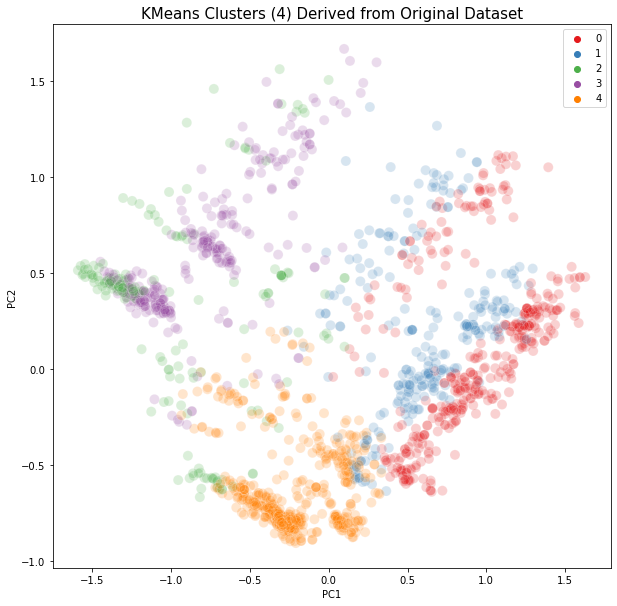

In [290]:
pca(dataset,5)

In [291]:
# Silhouette analysis can be used to study the separation distance between the resulting clusters
def silhouette(dataset):
    kmeans_scale = KMeans(n_clusters=5, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(dataset)
    print('KMeans Scaled Silhouette Score: {}'
          .format(silhouette_score(dataset, kmeans_scale.labels_, metric='euclidean')))
    labels_scale = kmeans_scale.labels_

In [ ]:
silhouette(dataset)